In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
cd '/content/drive/MyDrive/ML4H_project/Dataset'

/content/drive/MyDrive/ML4H_project/Dataset


# 0. Setup

In [ ]:
!pip install openslide-python lxml tqdm
!apt-get install -y openslide-tools
!pip install segmentation-models-pytorch
!pip install albumentations
!pip install optuna

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  libopenslide0
Suggested packages:
  libtiff-tools
The following NEW packages will be installed:
  libopenslide0 openslide-tools
0 upgraded, 2 newly installed, 0 to remove and 34 not upgraded.
Need to get 104 kB of archives.
After this operation, 297 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 libopenslide0 amd64 3.4.1+dfsg-5build1 [89.8 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/universe amd64 openslide-tools amd64 3.4.1+dfsg-5build1 [13.8 kB]
Fetched 104 kB in 2s (43.4 kB/s)
Selecting previously unselected package libopenslide0.
(Reading database ... 126101 files and directories currently installed.)
Preparing to unpack .../libopenslide0_3.4.1+dfsg-5build1_amd64.deb ...
Unpacking libopenslide0 (3.4.1+dfsg-5build1) ...
Selecting previously unselected package openslide-tools

# 1. Preprocessing Dataset (Already preprocessed, so don't have to execute)

## Step 1. Resize the tif file to png file (thumbnail: level_8 resize_2)

In [ ]:
### Execute this code for every tif files ###

import openslide
import numpy as np
from PIL import Image
from tqdm import tqdm

number_of_files = 160

for i in tqdm(range(number_of_files), desc="Generating thumbnails"):
    index_str = f"{i+87:03}"

    # Load the WSI
    file_path = f"/content/drive/MyDrive/ML4H_project/Dataset/normal/normal_{index_str}.tif"  # <-- Change this to your file path
    slide = openslide.OpenSlide(file_path)

    # Select a lower-resolution level (e.g., level 2)
    level = 4 # new: level4
    dims = slide.level_dimensions[level]

    # Read entire image at level 2
    region = slide.read_region((0, 0), level, dims)
    region_rgb = region.convert("RGB")

    # Further downscale the image (e.g., to 25% of current size)
    resize_factor = 0.25  # Change this factor as needed
    new_size = (int(region_rgb.width * resize_factor), int(region_rgb.height * resize_factor))
    resized_image = region_rgb.resize(new_size, resample=Image.LANCZOS)  # High-quality downsampling

    # Save the downscaled image
    resized_image.save(f"/content/drive/MyDrive/ML4H_project/Dataset/UNet_training/new/thumb_normal_{index_str}_new.png") ## new: level 4, resize 0.25

Generating thumbnails:  46%|████▋     | 74/160 [13:34<15:46, 11.00s/it]


OpenSlideUnsupportedFormatError: Unsupported or missing image file

## Step 2. Convert Tumor XML to Binary Mask

In [ ]:
### This is final XML annotation to PNG mask code ###
import openslide
import numpy as np
from PIL import Image, ImageDraw
import xml.etree.ElementTree as ET
import os

def asap_xml_to_mask(xml_path, slide_path, save_path, level, downsample_ratio=2):
    # Open the WSI file
    slide = openslide.OpenSlide(slide_path)

    # Parse XML
    tree = ET.parse(xml_path)
    root = tree.getroot()

    # Get slide dimensions and downsample factor
    mask_size = slide.level_dimensions[level]
    downsample = slide.level_downsamples[level]

    # Create blank mask
    mask = Image.new("L", mask_size, 0)
    draw = ImageDraw.Draw(mask)

    # Extract polygon coordinates from XML
    for annotation in root.findall(".//Annotation"):
        for coords in annotation.findall(".//Coordinates"):
            polygon = []
            for coord in coords.findall(".//Coordinate"):
                x = float(coord.attrib["X"]) / downsample
                y = float(coord.attrib["Y"]) / downsample
                polygon.append((x, y))
            if len(polygon) >= 3:
                draw.polygon(polygon, outline=1, fill=1)

    # Convert to uint8 mask image
    mask_np = np.array(mask, dtype=np.uint8) * 255
    mask_img = Image.fromarray(mask_np)

    # Resize before saving
    if downsample_ratio > 1:
        new_size = (mask_img.width // downsample_ratio, mask_img.height // downsample_ratio)
        mask_img = mask_img.resize(new_size, resample=Image.LANCZOS)

    mask_img.save(save_path)
    print(f"Saved mask to {save_path}")

In [ ]:
xml_dir = "/content/drive/MyDrive/ML4H_project/Dataset/tumor_annotations"
slide_dir = "/content/drive/MyDrive/ML4H_project/Dataset/tumor"
save_dir = "/content/drive/MyDrive/ML4H_project/Dataset/UNet_training/new"

index_str = f"{1:03}"  # zero-pads the number to 3 digits
xml_path = os.path.join(xml_dir, f"tumor_{index_str}.xml")
slide_path = os.path.join(slide_dir, f"tumor_{index_str}.tif")
save_path = os.path.join(save_dir, f"thumb_tumor_{index_str}_mask_new.png")

asap_xml_to_mask(
    xml_path,
    slide_path,
    save_path,
    level=4,  # Choose level based on memory/performance tradeoff
    downsample_ratio=4
)

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_001_mask_new.png


In [ ]:
from tqdm import tqdm

number_of_masks = 111

for i in tqdm(range(number_of_masks), desc="Generating masks"):
    index_str = f"{i+1:03}"  # zero-pads the number to 3 digits
    asap_xml_to_mask(
        xml_path=f"/content/drive/MyDrive/ML4H_project/Dataset/tumor_annotations/tumor_{index_str}.xml",
        slide_path=f"/content/drive/MyDrive/ML4H_project/Dataset/tumor/tumor_{index_str}.tif",
        save_path=f"/content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_{index_str}_new_mask_new.png",
        level=4,  # Choose level based on memory/performance tradeoff
        downsample_ratio=4
    )

Generating masks:   1%|          | 1/111 [00:00<01:46,  1.03it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_001_new_mask_new.png


Generating masks:   2%|▏         | 2/111 [00:01<01:44,  1.04it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_002_new_mask_new.png


Generating masks:   3%|▎         | 3/111 [00:02<01:42,  1.06it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_003_new_mask_new.png


Generating masks:   4%|▎         | 4/111 [00:03<01:41,  1.06it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_004_new_mask_new.png


Generating masks:   5%|▍         | 5/111 [00:04<01:40,  1.05it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_005_new_mask_new.png


Generating masks:   5%|▌         | 6/111 [00:05<01:39,  1.05it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_006_new_mask_new.png


Generating masks:   6%|▋         | 7/111 [00:06<01:37,  1.06it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_007_new_mask_new.png


Generating masks:   7%|▋         | 8/111 [00:07<01:35,  1.08it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_008_new_mask_new.png


Generating masks:   8%|▊         | 9/111 [00:08<01:35,  1.07it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_009_new_mask_new.png


Generating masks:   9%|▉         | 10/111 [00:09<01:33,  1.08it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_010_new_mask_new.png


Generating masks:  10%|▉         | 11/111 [00:10<01:39,  1.00it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_011_new_mask_new.png


Generating masks:  11%|█         | 12/111 [00:11<01:35,  1.04it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_012_new_mask_new.png


Generating masks:  12%|█▏        | 13/111 [00:12<01:32,  1.06it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_013_new_mask_new.png


Generating masks:  13%|█▎        | 14/111 [00:13<01:33,  1.03it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_014_new_mask_new.png


Generating masks:  14%|█▎        | 15/111 [00:14<01:32,  1.03it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_015_new_mask_new.png


Generating masks:  14%|█▍        | 16/111 [00:15<01:31,  1.04it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_016_new_mask_new.png


Generating masks:  15%|█▌        | 17/111 [00:16<01:29,  1.05it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_017_new_mask_new.png


Generating masks:  16%|█▌        | 18/111 [00:17<01:32,  1.00it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_018_new_mask_new.png


Generating masks:  17%|█▋        | 19/111 [00:18<01:29,  1.03it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_019_new_mask_new.png


Generating masks:  18%|█▊        | 20/111 [00:19<01:31,  1.01s/it]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_020_new_mask_new.png


Generating masks:  19%|█▉        | 21/111 [00:20<01:29,  1.00it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_021_new_mask_new.png


Generating masks:  20%|█▉        | 22/111 [00:21<01:27,  1.02it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_022_new_mask_new.png


Generating masks:  21%|██        | 23/111 [00:22<01:24,  1.04it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_023_new_mask_new.png


Generating masks:  22%|██▏       | 24/111 [00:23<01:22,  1.05it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_024_new_mask_new.png


Generating masks:  23%|██▎       | 25/111 [00:24<01:23,  1.03it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_025_new_mask_new.png


Generating masks:  23%|██▎       | 26/111 [00:25<01:23,  1.02it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_026_new_mask_new.png


Generating masks:  24%|██▍       | 27/111 [00:26<01:20,  1.04it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_027_new_mask_new.png


Generating masks:  25%|██▌       | 28/111 [00:26<01:19,  1.05it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_028_new_mask_new.png


Generating masks:  26%|██▌       | 29/111 [00:27<01:20,  1.02it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_029_new_mask_new.png


Generating masks:  27%|██▋       | 30/111 [00:28<01:17,  1.05it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_030_new_mask_new.png


Generating masks:  28%|██▊       | 31/111 [00:30<01:21,  1.02s/it]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_031_new_mask_new.png


Generating masks:  29%|██▉       | 32/111 [00:30<01:18,  1.00it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_032_new_mask_new.png


Generating masks:  30%|██▉       | 33/111 [00:31<01:16,  1.02it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_033_new_mask_new.png


Generating masks:  31%|███       | 34/111 [00:33<01:18,  1.02s/it]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_034_new_mask_new.png


Generating masks:  32%|███▏      | 35/111 [00:33<01:15,  1.01it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_035_new_mask_new.png


Generating masks:  32%|███▏      | 36/111 [00:35<01:18,  1.04s/it]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_036_new_mask_new.png


Generating masks:  33%|███▎      | 37/111 [00:36<01:15,  1.02s/it]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_037_new_mask_new.png


Generating masks:  34%|███▍      | 38/111 [00:37<01:15,  1.04s/it]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_038_new_mask_new.png


Generating masks:  35%|███▌      | 39/111 [00:38<01:17,  1.07s/it]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_039_new_mask_new.png


Generating masks:  36%|███▌      | 40/111 [00:39<01:12,  1.02s/it]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_040_new_mask_new.png


Generating masks:  37%|███▋      | 41/111 [00:40<01:09,  1.01it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_041_new_mask_new.png


Generating masks:  38%|███▊      | 42/111 [00:41<01:06,  1.03it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_042_new_mask_new.png


Generating masks:  39%|███▊      | 43/111 [00:42<01:05,  1.04it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_043_new_mask_new.png


Generating masks:  40%|███▉      | 44/111 [00:43<01:07,  1.01s/it]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_044_new_mask_new.png


Generating masks:  41%|████      | 45/111 [00:44<01:04,  1.03it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_045_new_mask_new.png


Generating masks:  41%|████▏     | 46/111 [00:45<01:06,  1.02s/it]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_046_new_mask_new.png


Generating masks:  42%|████▏     | 47/111 [00:46<01:09,  1.08s/it]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_047_new_mask_new.png


Generating masks:  43%|████▎     | 48/111 [00:47<01:04,  1.03s/it]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_048_new_mask_new.png


Generating masks:  44%|████▍     | 49/111 [00:48<01:02,  1.00s/it]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_049_new_mask_new.png


Generating masks:  45%|████▌     | 50/111 [00:49<00:59,  1.03it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_050_new_mask_new.png


Generating masks:  46%|████▌     | 51/111 [00:50<00:59,  1.00it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_051_new_mask_new.png


Generating masks:  47%|████▋     | 52/111 [00:51<00:57,  1.03it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_052_new_mask_new.png


Generating masks:  48%|████▊     | 53/111 [00:51<00:55,  1.05it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_053_new_mask_new.png


Generating masks:  49%|████▊     | 54/111 [00:53<00:55,  1.03it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_054_new_mask_new.png


Generating masks:  50%|████▉     | 55/111 [00:54<00:56,  1.01s/it]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_055_new_mask_new.png


Generating masks:  50%|█████     | 56/111 [00:55<00:54,  1.00it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_056_new_mask_new.png


Generating masks:  51%|█████▏    | 57/111 [00:56<00:54,  1.01s/it]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_057_new_mask_new.png


Generating masks:  52%|█████▏    | 58/111 [00:57<00:52,  1.00it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_058_new_mask_new.png


Generating masks:  53%|█████▎    | 59/111 [00:58<00:51,  1.02it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_059_new_mask_new.png


Generating masks:  54%|█████▍    | 60/111 [00:58<00:49,  1.04it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_060_new_mask_new.png


Generating masks:  55%|█████▍    | 61/111 [01:00<00:50,  1.02s/it]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_061_new_mask_new.png


Generating masks:  56%|█████▌    | 62/111 [01:01<00:48,  1.01it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_062_new_mask_new.png


Generating masks:  57%|█████▋    | 63/111 [01:01<00:46,  1.04it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_063_new_mask_new.png


Generating masks:  58%|█████▊    | 64/111 [01:02<00:46,  1.00it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_064_new_mask_new.png


Generating masks:  59%|█████▊    | 65/111 [01:03<00:44,  1.03it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_065_new_mask_new.png


Generating masks:  59%|█████▉    | 66/111 [01:04<00:42,  1.06it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_066_new_mask_new.png


Generating masks:  60%|██████    | 67/111 [01:05<00:40,  1.08it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_067_new_mask_new.png


Generating masks:  61%|██████▏   | 68/111 [01:06<00:41,  1.03it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_068_new_mask_new.png


Generating masks:  62%|██████▏   | 69/111 [01:07<00:40,  1.05it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_069_new_mask_new.png


Generating masks:  63%|██████▎   | 70/111 [01:08<00:38,  1.07it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_070_new_mask_new.png


Generating masks:  64%|██████▍   | 71/111 [01:09<00:34,  1.17it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_071_new_mask_new.png


Generating masks:  65%|██████▍   | 72/111 [01:09<00:29,  1.31it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_072_new_mask_new.png


Generating masks:  66%|██████▌   | 73/111 [01:10<00:26,  1.43it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_073_new_mask_new.png


Generating masks:  67%|██████▋   | 74/111 [01:10<00:24,  1.49it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_074_new_mask_new.png


Generating masks:  68%|██████▊   | 75/111 [01:11<00:20,  1.72it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_075_new_mask_new.png


Generating masks:  68%|██████▊   | 76/111 [01:11<00:19,  1.75it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_076_new_mask_new.png


Generating masks:  69%|██████▉   | 77/111 [01:12<00:19,  1.78it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_077_new_mask_new.png


Generating masks:  70%|███████   | 78/111 [01:13<00:19,  1.68it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_078_new_mask_new.png


Generating masks:  71%|███████   | 79/111 [01:13<00:20,  1.57it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_079_new_mask_new.png


Generating masks:  72%|███████▏  | 80/111 [01:14<00:20,  1.54it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_080_new_mask_new.png


Generating masks:  73%|███████▎  | 81/111 [01:14<00:17,  1.71it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_081_new_mask_new.png


Generating masks:  74%|███████▍  | 82/111 [01:15<00:16,  1.76it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_082_new_mask_new.png


Generating masks:  75%|███████▍  | 83/111 [01:16<00:16,  1.71it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_083_new_mask_new.png


Generating masks:  76%|███████▌  | 84/111 [01:16<00:13,  2.01it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_084_new_mask_new.png


Generating masks:  77%|███████▋  | 85/111 [01:16<00:12,  2.01it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_085_new_mask_new.png


Generating masks:  77%|███████▋  | 86/111 [01:17<00:13,  1.80it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_086_new_mask_new.png


Generating masks:  78%|███████▊  | 87/111 [01:18<00:12,  1.87it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_087_new_mask_new.png


Generating masks:  79%|███████▉  | 88/111 [01:18<00:13,  1.75it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_088_new_mask_new.png


Generating masks:  80%|████████  | 89/111 [01:19<00:13,  1.62it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_089_new_mask_new.png


Generating masks:  81%|████████  | 90/111 [01:20<00:13,  1.59it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_090_new_mask_new.png


Generating masks:  82%|████████▏ | 91/111 [01:20<00:10,  1.99it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_091_new_mask_new.png


Generating masks:  83%|████████▎ | 92/111 [01:21<00:11,  1.69it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_092_new_mask_new.png


Generating masks:  84%|████████▍ | 93/111 [01:21<00:09,  1.87it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_093_new_mask_new.png


Generating masks:  85%|████████▍ | 94/111 [01:21<00:09,  1.88it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_094_new_mask_new.png


Generating masks:  86%|████████▌ | 95/111 [01:22<00:10,  1.55it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_095_new_mask_new.png


Generating masks:  86%|████████▋ | 96/111 [01:23<00:08,  1.72it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_096_new_mask_new.png


Generating masks:  87%|████████▋ | 97/111 [01:23<00:07,  1.85it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_097_new_mask_new.png


Generating masks:  88%|████████▊ | 98/111 [01:24<00:06,  1.97it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_098_new_mask_new.png


Generating masks:  89%|████████▉ | 99/111 [01:24<00:05,  2.00it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_099_new_mask_new.png


Generating masks:  90%|█████████ | 100/111 [01:25<00:05,  2.07it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_100_new_mask_new.png


Generating masks:  91%|█████████ | 101/111 [01:25<00:04,  2.12it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_101_new_mask_new.png


Generating masks:  92%|█████████▏| 102/111 [01:26<00:05,  1.67it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_102_new_mask_new.png


Generating masks:  93%|█████████▎| 103/111 [01:27<00:04,  1.65it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_103_new_mask_new.png


Generating masks:  94%|█████████▎| 104/111 [01:27<00:04,  1.70it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_104_new_mask_new.png


Generating masks:  95%|█████████▍| 105/111 [01:28<00:03,  1.85it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_105_new_mask_new.png


Generating masks:  95%|█████████▌| 106/111 [01:28<00:02,  1.76it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_106_new_mask_new.png


Generating masks:  96%|█████████▋| 107/111 [01:29<00:01,  2.01it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_107_new_mask_new.png


Generating masks:  97%|█████████▋| 108/111 [01:29<00:01,  1.85it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_108_new_mask_new.png


Generating masks:  98%|█████████▊| 109/111 [01:30<00:01,  1.90it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_109_new_mask_new.png


Generating masks:  99%|█████████▉| 110/111 [01:30<00:00,  2.08it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_110_new_mask_new.png


Generating masks: 100%|██████████| 111/111 [01:31<00:00,  1.21it/s]

Saved mask to /content/drive/MyDrive/ML4H_project/Dataset/UNet_training/thumb_tumor_111_new_mask_new.png


## Step 3. Making masks for normal dataset

In [ ]:
import os
from PIL import Image
import numpy as np
from tqdm import tqdm

# Input and output paths
image_dir = "/content/drive/MyDrive/ML4H_project/Dataset/UNet_training/new"
save_dir = "/content/drive/MyDrive/ML4H_project/Dataset/UNet_training/new"
os.makedirs(save_dir, exist_ok=True)

# Loop over all PNG files
for filename in tqdm(os.listdir(image_dir), desc="Creating empty masks"):
    if filename.endswith(".png"):
        image_path = os.path.join(image_dir, filename)
        img = Image.open(image_path)
        width, height = img.size

        # Create all-zero (black) mask with same size
        mask = Image.fromarray(np.zeros((height, width), dtype=np.uint8))

        # Save mask
        mask.save(os.path.join(save_dir, filename.replace(".png", "_mask_new.png")))

Creating empty masks: 100%|██████████| 162/162 [00:06<00:00, 26.08it/s]


## Step 4. Checking the size of the generated masks

In [ ]:
cd '/content/drive/MyDrive/ML4H_project/Dataset/UNet_training'

/content/drive/MyDrive/ML4H_project/Dataset/UNet_training


In [ ]:
from PIL import Image

# Load the image
image = Image.open("thumb_tumor_001_mask_new.png")

# Check its size (width, height)
print("Image size:", image.size)  # (width, height)

# If you want width and height separately
width, height = image.size
print("Width:", width)
print("Height:", height)

Image size: (1528, 3456)
Width: 1528
Height: 3456


## Step 5. Checking the size of the resized WSIs

In [ ]:
cd '/content/drive/MyDrive/ML4H_project/Dataset/UNet_training/new'

/content/drive/MyDrive/ML4H_project/Dataset/UNet_training/new


In [ ]:
from PIL import Image

# Load the image
image = Image.open("thumb_tumor_001_new.png")

# Check its size (width, height)
print("Image size:", image.size)  # (width, height)

# If you want width and height separately
width, height = image.size
print("Width:", width)
print("Height:", height)

Image size: (1528, 3456)
Width: 1528
Height: 3456


## Step 6. Generate mask-ovelayed image on WSIs

In [ ]:
from PIL import Image
import numpy as np
from tqdm import tqdm

number_of_masks = 1

for i in tqdm(range(number_of_masks), desc="Generating overlays"):
    index_str = f"{i+0:03}"

    background_path = f"/content/drive/MyDrive/ML4H_project/Dataset/UNet_training/test/Copy of thumb_tumor_110.png"
    mask_path = f"/content/drive/MyDrive/ML4H_project/Dataset/UNet_training/pred_mask/pred_39.png"

    # Load and convert to RGBA
    background = Image.open(background_path).convert("RGBA")
    overlay = Image.open(mask_path).convert("RGBA")

    # Resize mask to match image if needed
    if overlay.size != background.size:
        overlay = overlay.resize(background.size, resample=Image.BILINEAR)

    # Convert to NumPy
    background_np = np.array(background)
    overlay_np = np.array(overlay)

    # Load original mask as grayscale (not RGBA)
    mask_gray = Image.open(mask_path).convert("L")
    if mask_gray.size != background.size:
        mask_gray = mask_gray.resize(background.size, resample=Image.BILINEAR)
    mask_np = np.array(mask_gray)

    # Where mask is 255 (tumor), use background (original image)
    condition = mask_np == 255
    result_np = np.where(condition[:, :, None], background_np, overlay_np)

    # Convert back to image and save
    result = Image.fromarray(result_np.astype(np.uint8))
    result.save(f"/content/drive/MyDrive/ML4H_project/Dataset/UNet_training/pred_39_overlay_example.png")

Generating overlays: 100%|██████████| 1/1 [00:00<00:00, 62.20it/s]


# 2. Build and Train a U-Net Model

## Step 1.Resizing and augmentation the input for training UNet

In [ ]:
### Make another augmented 4n train dataset ###

import os
import numpy as np
from PIL import Image
import albumentations as A
from tqdm import tqdm

# Input dir: original images and masks
input_dir = "/content/drive/MyDrive/ML4H_project/Dataset/UNet_training/new/train"
output_dir = "/content/drive/MyDrive/ML4H_project/Dataset/UNet_training/new/resize/train"
os.makedirs(output_dir, exist_ok=True)

image_size = (1024, 1024)

# Define transformations
base_transform = A.Resize(*image_size)
augmentations = {
    "orig": A.Compose([base_transform]),
    "flip_h": A.Compose([base_transform, A.HorizontalFlip(p=1.0)]),
    "flip_v": A.Compose([base_transform, A.VerticalFlip(p=1.0)]),
    "rotate": A.Compose([base_transform, A.ShiftScaleRotate(p=1.0)]),
    "bright": A.Compose([base_transform, A.RandomBrightnessContrast(p=1.0)])
}

# Process all PNG images
image_filenames = sorted([
    f for f in os.listdir(input_dir) if f.endswith(".png") and "_mask_new" not in f
])

for image_name in tqdm(image_filenames):
    image_path = os.path.join(input_dir, image_name)
    mask_path = os.path.join(input_dir, image_name.replace(".png", "_mask_new.png"))

    image = np.array(Image.open(image_path).convert("RGB"))
    mask = np.array(Image.open(mask_path).convert("L"))

    for key, transform in augmentations.items():
        augmented = transform(image=image, mask=mask)
        aug_img = Image.fromarray(augmented["image"])
        aug_mask = Image.fromarray(augmented["mask"])

        # Save new image and mask
        save_prefix = image_name.replace(".png", f"_{key}")
        aug_img.save(os.path.join(output_dir, f"{save_prefix}.png"))
        aug_mask.save(os.path.join(output_dir, f"{save_prefix}_mask_new.png"))

100%|██████████| 189/189 [03:21<00:00,  1.07s/it]


## Step 1-1. On-the-fly data augmentation

In [ ]:
### On-the-fly data augmentation ###

import os
import numpy as np
from PIL import Image
from torch.utils.data import Dataset
import albumentations as A
from albumentations.pytorch import ToTensorV2

class SegmentationDataset(Dataset):
    def __init__(self, image_dir, image_size=(1024, 1024), augment=False):
        self.image_dir = image_dir
        self.image_size = image_size
        self.augment = augment
        self.image_filenames = sorted([
            f for f in os.listdir(image_dir) if f.endswith(".png") and "_mask_new" not in f
        ])

        if self.augment:
            # Training: resize + augmentations
            self.transform = A.Compose([
                A.Resize(*image_size),
                A.HorizontalFlip(p=0.5),
                A.VerticalFlip(p=0.5),
                A.ShiftScaleRotate(p=0.5),
                A.RandomBrightnessContrast(p=0.5),
                A.Normalize(),
                ToTensorV2()
            ])
        else:
            # Validation: no resizing, just normalization and tensor conversion
            self.transform = A.Compose([
                A.Normalize(),
                ToTensorV2()
            ])

    def __len__(self):
        return len(self.image_filenames)

    def __getitem__(self, idx):
        image_name = self.image_filenames[idx]
        image_path = os.path.join(self.image_dir, image_name)
        mask_path = os.path.join(self.image_dir, image_name.replace(".png", "_mask_new.png"))

        image = np.array(Image.open(image_path).convert("RGB"))
        mask = np.array(Image.open(mask_path).convert("L"))
        mask = (mask > 0).astype("float32")

        augmented = self.transform(image=image, mask=mask)
        return augmented["image"], augmented["mask"].unsqueeze(0)  # shape: [1, H, W]

/usr/local/lib/python3.11/dist-packages/albumentations/__init__.py:28: UserWarning: A new version of Albumentations is available: '2.0.6' (you have '2.0.5'). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


## Step 2. Import pre-trained UNet

In [ ]:
import segmentation_models_pytorch as smp

model = smp.Unet(
    encoder_name="efficientnet-b0",        # Try 'efficientnet-b0' for faster/lighter model
    encoder_weights="imagenet",     # Pretrained encoder
    in_channels=3,                  # RGB input
    classes=1                       # Binary segmentation
)

In [ ]:
import segmentation_models_pytorch as smp

model = smp.UnetPlusPlus(
    encoder_name="efficientnet-b0",  # Pretrained Swin-Tiny encoder
    encoder_weights="imagenet",
    in_channels=3,
    classes=1,  # Binary segmentation
    activation=None  # We will apply sigmoid later
)

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/106 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/21.4M [00:00<?, ?B/s]

## Step 3. UNet Training

/usr/local/lib/python3.11/dist-packages/albumentations/core/validation.py:87: UserWarning: ShiftScaleRotate is a special case of Affine transform. Please use Affine transform instead.
  original_init(self, **validated_kwargs)
Epoch 1: 100%|██████████| 50/50 [00:18<00:00,  2.73it/s]


Epoch 1, Train Loss: 0.6498


Epoch 2: 100%|██████████| 50/50 [00:15<00:00,  3.17it/s]


Epoch 2, Train Loss: 0.4838


Epoch 3: 100%|██████████| 50/50 [00:15<00:00,  3.17it/s]


Epoch 3, Train Loss: 0.3801


Epoch 4: 100%|██████████| 50/50 [00:15<00:00,  3.13it/s]


Epoch 4, Train Loss: 0.2974


Epoch 5: 100%|██████████| 50/50 [00:16<00:00,  3.10it/s]


Epoch 5, Train Loss: 0.2343


Epoch 6: 100%|██████████| 50/50 [00:16<00:00,  3.06it/s]


Epoch 6, Train Loss: 0.1926


Epoch 7: 100%|██████████| 50/50 [00:16<00:00,  3.03it/s]


Epoch 7, Train Loss: 0.1580


Epoch 8: 100%|██████████| 50/50 [00:16<00:00,  2.97it/s]


Epoch 8, Train Loss: 0.1388


Epoch 9: 100%|██████████| 50/50 [00:16<00:00,  2.97it/s]


Epoch 9, Train Loss: 0.1176


Epoch 10: 100%|██████████| 50/50 [00:16<00:00,  3.00it/s]


Epoch 10, Train Loss: 0.1019


Epoch 11: 100%|██████████| 50/50 [00:16<00:00,  3.02it/s]


Epoch 11, Train Loss: 0.0900


Epoch 12: 100%|██████████| 50/50 [00:16<00:00,  3.02it/s]


Epoch 12, Train Loss: 0.0794


Epoch 13: 100%|██████████| 50/50 [00:16<00:00,  3.01it/s]


Epoch 13, Train Loss: 0.0720


Epoch 14: 100%|██████████| 50/50 [00:16<00:00,  3.00it/s]


Epoch 14, Train Loss: 0.0650


Epoch 15: 100%|██████████| 50/50 [00:16<00:00,  3.00it/s]


Epoch 15, Train Loss: 0.0658


Epoch 16: 100%|██████████| 50/50 [00:16<00:00,  3.01it/s]


Epoch 16, Train Loss: 0.0565


Epoch 17: 100%|██████████| 50/50 [00:16<00:00,  3.01it/s]


Epoch 17, Train Loss: 0.0517


Epoch 18: 100%|██████████| 50/50 [00:16<00:00,  3.00it/s]


Epoch 18, Train Loss: 0.0474


Epoch 19: 100%|██████████| 50/50 [00:16<00:00,  3.02it/s]


Epoch 19, Train Loss: 0.0430


Epoch 20: 100%|██████████| 50/50 [00:16<00:00,  3.01it/s]


Epoch 20, Train Loss: 0.0410


Epoch 21: 100%|██████████| 50/50 [00:16<00:00,  3.01it/s]


Epoch 21, Train Loss: 0.0379


Epoch 22: 100%|██████████| 50/50 [00:16<00:00,  3.00it/s]


Epoch 22, Train Loss: 0.0357


Epoch 23: 100%|██████████| 50/50 [00:16<00:00,  3.00it/s]


Epoch 23, Train Loss: 0.0338


Epoch 24: 100%|██████████| 50/50 [00:16<00:00,  3.01it/s]


Epoch 24, Train Loss: 0.0314


Epoch 25: 100%|██████████| 50/50 [00:16<00:00,  3.00it/s]


Epoch 25, Train Loss: 0.0292


Epoch 26: 100%|██████████| 50/50 [00:16<00:00,  3.01it/s]


Epoch 26, Train Loss: 0.0286


Epoch 27: 100%|██████████| 50/50 [00:16<00:00,  3.01it/s]


Epoch 27, Train Loss: 0.0300


Epoch 28: 100%|██████████| 50/50 [00:16<00:00,  3.00it/s]


Epoch 28, Train Loss: 0.0268


Epoch 29: 100%|██████████| 50/50 [00:16<00:00,  3.01it/s]


Epoch 29, Train Loss: 0.0245


Epoch 30: 100%|██████████| 50/50 [00:16<00:00,  3.01it/s]


Epoch 30, Train Loss: 0.0230


Epoch 31: 100%|██████████| 50/50 [00:16<00:00,  3.00it/s]


Epoch 31, Train Loss: 0.0217


Epoch 32: 100%|██████████| 50/50 [00:16<00:00,  3.01it/s]


Epoch 32, Train Loss: 0.0211


Epoch 33: 100%|██████████| 50/50 [00:16<00:00,  3.00it/s]


Epoch 33, Train Loss: 0.0198


Epoch 34: 100%|██████████| 50/50 [00:16<00:00,  3.00it/s]


Epoch 34, Train Loss: 0.0194


Epoch 35: 100%|██████████| 50/50 [00:16<00:00,  3.01it/s]


Epoch 35, Train Loss: 0.0184


Epoch 36: 100%|██████████| 50/50 [00:16<00:00,  2.99it/s]


Epoch 36, Train Loss: 0.0178


Epoch 37: 100%|██████████| 50/50 [00:16<00:00,  3.00it/s]


Epoch 37, Train Loss: 0.0205


Epoch 38: 100%|██████████| 50/50 [00:16<00:00,  3.00it/s]


Epoch 38, Train Loss: 0.0208


Epoch 39: 100%|██████████| 50/50 [00:16<00:00,  3.01it/s]


Epoch 39, Train Loss: 0.0165


Epoch 40: 100%|██████████| 50/50 [00:16<00:00,  3.02it/s]


Epoch 40, Train Loss: 0.0158


Epoch 41: 100%|██████████| 50/50 [00:16<00:00,  3.01it/s]


Epoch 41, Train Loss: 0.0153


Epoch 42: 100%|██████████| 50/50 [00:16<00:00,  3.01it/s]


Epoch 42, Train Loss: 0.0152


Epoch 43: 100%|██████████| 50/50 [00:16<00:00,  3.00it/s]


Epoch 43, Train Loss: 0.0143


Epoch 44: 100%|██████████| 50/50 [00:16<00:00,  3.00it/s]


Epoch 44, Train Loss: 0.0142


Epoch 45: 100%|██████████| 50/50 [00:16<00:00,  3.00it/s]


Epoch 45, Train Loss: 0.0135


Epoch 46: 100%|██████████| 50/50 [00:16<00:00,  3.01it/s]


Epoch 46, Train Loss: 0.0128


Epoch 47: 100%|██████████| 50/50 [00:16<00:00,  3.01it/s]


Epoch 47, Train Loss: 0.0130


Epoch 48: 100%|██████████| 50/50 [00:16<00:00,  3.00it/s]


Epoch 48, Train Loss: 0.0130


Epoch 49: 100%|██████████| 50/50 [00:16<00:00,  2.99it/s]

Epoch 49, Train Loss: 0.0118


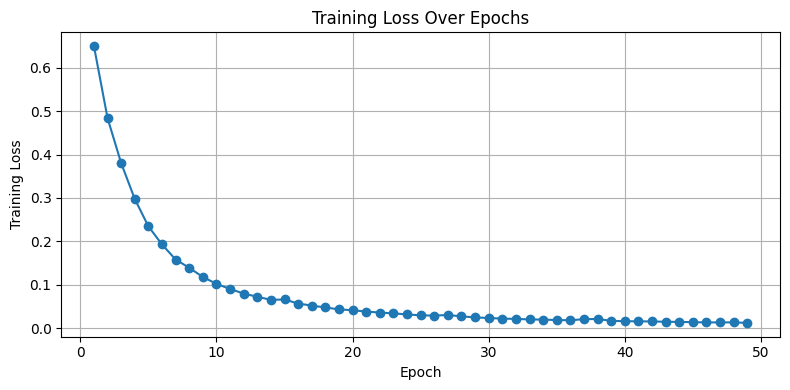

In [ ]:
import torch
from torch.utils.data import DataLoader
import torch.nn as nn
import torch.optim as optim
from tqdm import tqdm
import matplotlib.pyplot as plt

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)

#train_dataset = SegmentationDataset("/content/drive/MyDrive/ML4H_project/Dataset/UNet_training/new/resize/train", augment=True)
train_dataset = SegmentationDataset("/content/drive/MyDrive/ML4H_project/Dataset/UNet_training/new/small/train", augment=True) ## Small dataset

#val_dataset = SegmentationDataset("/content/drive/MyDrive/ML4H_project/Dataset/UNet_training/new/valid", augment=False)
val_dataset = SegmentationDataset("/content/drive/MyDrive/ML4H_project/Dataset/UNet_training/new/small/valid", augment=False) ## Small dataset



train_loader = DataLoader(train_dataset, batch_size=1, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=1)

criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-4)

train_losses = []

epoch_val = 50

for epoch in range(1, epoch_val):
    model.train()
    train_loss = 0
    for images, masks in tqdm(train_loader, desc=f"Epoch {epoch}"):
        images, masks = images.to(device), masks.to(device)

        outputs = model(images)
        loss = criterion(outputs, masks)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_loss += loss.item()

    avg_loss = train_loss / len(train_loader)
    train_losses.append(avg_loss)
    print(f"Epoch {epoch}, Train Loss: {avg_loss:.4f}")

# ✅ Plot loss vs. epoch
plt.figure(figsize=(8, 4))
plt.plot(range(1, len(train_losses) + 1), train_losses, marker='o')
plt.xlabel("Epoch")
plt.ylabel("Training Loss")
plt.title("Training Loss Over Epochs")
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
torch.save({
    'epoch': epoch,
    'model_state_dict': model.state_dict(),
    'optimizer_state_dict': optimizer.state_dict(),
    'loss': loss,
}, '/content/drive/MyDrive/ML4H_project/Dataset/UNet_training/new/small/UNet_plusplus_checkpoint.pth')

## Step 4-1. Mask prediction_binary_UNet

0it [00:00, ?it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1007793..2.6399999].


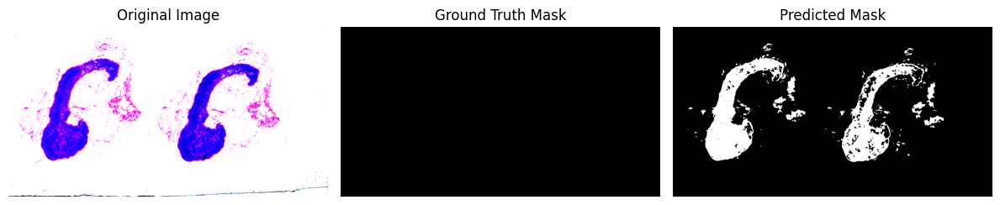

1it [00:02,  2.94s/it]


RuntimeError: Wrong input shape height=1680, width=3008. Expected image height and width divisible by 32. Consider pad your images to shape (1696, 3008).

In [ ]:
import matplotlib.pyplot as plt

test_dataset = SegmentationDataset("/content/drive/MyDrive/ML4H_project/Dataset/UNet_training/new/test", augment=False)
test_loader = DataLoader(test_dataset, batch_size=1)

model.eval()

count = 0
with torch.no_grad():
    for i, (images, masks) in tqdm(enumerate(test_loader)):

        count += 1
        images = images.to(device)
        preds = model(images)
        preds = (preds > 0.5).float()

        # Convert tensors to NumPy for plotting
        image_np = images.squeeze(0).permute(1, 2, 0).cpu().numpy()
        mask_np = masks.squeeze(0).squeeze(0).cpu().numpy()
        pred_np = preds.squeeze(0).squeeze(0).cpu().numpy()

        # Plot side-by-side
        fig, axs = plt.subplots(1, 3, figsize=(12, 4))
        axs[0].imshow(image_np)
        axs[0].set_title("Original Image")
        axs[0].axis("off")

        axs[1].imshow(mask_np, cmap='gray')
        axs[1].set_title("Ground Truth Mask")
        axs[1].axis("off")

        axs[2].imshow(pred_np, cmap='gray')
        axs[2].set_title("Predicted Mask")
        axs[2].axis("off")

        # Save as PNG
        pred_uint8 = (pred_np * 255).astype(np.uint8)  # scale and convert

        img = Image.fromarray(pred_uint8)
        img.save("/content/drive/MyDrive/ML4H_project/Dataset/UNet_training/pred_mask/pred_" + str(count) + ".png")

        plt.tight_layout()
        plt.show()

## Step 4-2. Mask prediction_heatmap_UNet



In [ ]:
import matplotlib.pyplot as plt
import torch
from PIL import Image
import numpy as np
from tqdm import tqdm
import matplotlib.cm as cm
from mpl_toolkits.axes_grid1 import make_axes_locatable  # for neat colorbar

test_dataset = SegmentationDataset("/content/drive/MyDrive/ML4H_project/Dataset/UNet_training/new/test", image_size=(256, 256), augment=False)
test_loader = DataLoader(test_dataset, batch_size=1)

model.eval()

count = 0
with torch.no_grad():
    for i, (images, masks) in tqdm(enumerate(test_loader)):

        count += 1
        images = images.to(device)

        preds = model(images)
        preds = preds.squeeze(1)

        # Convert tensors to NumPy
        image_np = images.squeeze(0).permute(1, 2, 0).cpu().numpy()
        mask_np = masks.squeeze(0).squeeze(0).cpu().numpy()
        pred_np = preds.squeeze(0).cpu().numpy()

        # ---- Make RGBA heatmap ----
        cmap = cm.get_cmap('jet', 256)  # smoother, more gradual color transition
        heatmap_rgba = cmap(pred_np)  # shape (H, W, 4)

        # Adjust the alpha channel:
        heatmap_rgba[..., -1] = pred_np  # alpha proportional to prediction (0~1)

        # Plot side-by-side
        fig, axs = plt.subplots(1, 3, figsize=(20, 7))

        # 1. Original Image
        axs[0].imshow(image_np)
        axs[0].set_title("Original Image")
        axs[0].axis("off")

        # 2. Ground Truth Mask
        axs[1].imshow(mask_np, cmap='gray')
        axs[1].set_title("Ground Truth Mask")
        axs[1].axis("off")

        # 3. Overlay: Original + Transparent Heatmap
        axs[2].imshow(image_np)
        im = axs[2].imshow(heatmap_rgba)
        axs[2].set_title("Overlayed Transparent Heatmap")
        axs[2].axis("off")

        # Colorbar without resizing the subplot
        divider = make_axes_locatable(axs[2])
        cax = divider.append_axes("right", size="5%", pad=0.05)
        norm = plt.Normalize(vmin=0, vmax=1)  # Normalize from 0 to 1
        sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
        sm.set_array([])
        fig.colorbar(sm, cax=cax)

        plt.tight_layout()
        plt.show()

        # Save the raw prediction (optional)
        pred_uint8 = (pred_np * 255).astype(np.uint8)
        img = Image.fromarray(pred_uint8)
        img.save("/content/drive/MyDrive/ML4H_project/Dataset/UNet_training/pred_mask/pred_" + str(count) + ".png")

NameError: name 'SegmentationDataset' is not defined

# 3. Build and Train a Transformer model

## Step 1. Import Transformer model

In [ ]:
from transformers import SegformerForSemanticSegmentation

model = SegformerForSemanticSegmentation.from_pretrained("nvidia/mit-b4", num_labels=1,  # ✅ must match what you used when training
    ignore_mismatched_sizes=True).to(device)  # ✅ allows weight loading even if size mismatch in head)

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/70.0k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/246M [00:00<?, ?B/s]

Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/mit-b4 and are newly initialized: ['decode_head.batch_norm.bias', 'decode_head.batch_norm.num_batches_tracked', 'decode_head.batch_norm.running_mean', 'decode_head.batch_norm.running_var', 'decode_head.batch_norm.weight', 'decode_head.classifier.bias', 'decode_head.classifier.weight', 'decode_head.linear_c.0.proj.bias', 'decode_head.linear_c.0.proj.weight', 'decode_head.linear_c.1.proj.bias', 'decode_head.linear_c.1.proj.weight', 'decode_head.linear_c.2.proj.bias', 'decode_head.linear_c.2.proj.weight', 'decode_head.linear_c.3.proj.bias', 'decode_head.linear_c.3.proj.weight', 'decode_head.linear_fuse.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


## Step 2. Dataset formation & On-the-fly augmentation

In [ ]:
import os
import numpy as np
from PIL import Image
from torch.utils.data import Dataset
import albumentations as A
from albumentations.pytorch import ToTensorV2

class SegmentationDataset(Dataset):
    def __init__(self, image_dir, image_size=(1024, 1024), augment=False):
        self.image_dir = image_dir
        self.image_size = image_size
        self.augment = augment
        self.image_filenames = sorted([
            f for f in os.listdir(image_dir) if f.endswith(".png") and "_mask_new" not in f
        ])

        resize = A.Resize(*self.image_size)

        if self.augment:
            self.transform = A.Compose([
                resize,
                A.HorizontalFlip(p=0.5),
                A.VerticalFlip(p=0.5),
                A.ShiftScaleRotate(p=0.5),
                A.RandomBrightnessContrast(p=0.5),
                A.Normalize(),
                ToTensorV2()
            ])
        else:
            self.transform = A.Compose([
                resize,
                A.Normalize(),
                ToTensorV2()
            ])

    def __len__(self):
        return len(self.image_filenames)

    def __getitem__(self, idx):
        image_name = self.image_filenames[idx]
        image_path = os.path.join(self.image_dir, image_name)
        mask_path = os.path.join(self.image_dir, image_name.replace(".png", "_mask_new.png"))

        image = np.array(Image.open(image_path).convert("RGB"))
        mask = np.array(Image.open(mask_path).convert("L"))

        mask = (mask > 0).astype("float32")  # make sure mask is 0 or 1

        augmented = self.transform(image=image, mask=mask)
        image = augmented["image"]
        mask = augmented["mask"]

        mask = mask.unsqueeze(0)  # [1, H, W]

        return image, mask

## Step 3. Load trained model for further training_Transformer

In [ ]:
### Load saved trained model ###
import torch
from torch.utils.data import DataLoader
import torch.nn as nn
import torch.optim as optim
from tqdm import tqdm
import matplotlib.pyplot as plt
# Load checkpoint safely
checkpoint_path = '/content/drive/MyDrive/ML4H_project/Dataset/UNet_training/new/best_segformer_model_full_epoch50_lr1e-4_5.pth'
checkpoint = torch.load(checkpoint_path, map_location=device)

# Case 1: If the checkpoint is a state_dict directly
try:
    model.load_state_dict(checkpoint)
except:
    # Case 2: Checkpoint is a dict with 'model_state_dict'
    model.load_state_dict(checkpoint['model_state_dict'])


#checkpoint = torch.load('/content/drive/MyDrive/ML4H_project/Dataset/UNet_training/new/best_segformer_model_full_epoch50_lr1e-4_5_lr1e-5_1_valloss.pth')
#model.load_state_dict(checkpoint['model_state_dict'])
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)
optimizer = optim.Adam(model.parameters(), lr=1e-4)
#optimizer.load_state_dict(checkpoint['optimizer_state_dict'])

#epoch = checkpoint['epoch']
#loss = checkpoint['loss']

## Step 4. Model Training_Transformer

In [ ]:
### New full code for Transformer training (with LR scheduling (reduce LR on plateau), Early stopping(patience=8), Save the best model (based on Dice), Plotting valid/train loss, Evaluation (Dice, IoU, precision/recall) ###

import torch
from torch.utils.data import DataLoader
import torch.nn as nn
import torch.optim as optim
from tqdm import tqdm
import matplotlib.pyplot as plt
from transformers import SegformerForSemanticSegmentation
import torch.nn.functional as F
import pandas as pd

# Metrics

def dice_score(preds, targets, threshold=0.5):
    preds = (preds > threshold).float()
    smooth = 1e-6
    intersection = (preds * targets).sum(dim=(1, 2))
    union = preds.sum(dim=(1, 2)) + targets.sum(dim=(1, 2))
    dice = (2. * intersection + smooth) / (union + smooth)
    return dice.mean().item()

def iou_score(preds, targets, threshold=0.5):
    preds = (preds > threshold).float()
    intersection = (preds * targets).sum(dim=(1, 2))
    union = ((preds + targets) >= 1).float().sum(dim=(1, 2))
    iou = (intersection + 1e-6) / (union + 1e-6)
    return iou.mean().item()

def precision_recall(preds, targets, threshold=0.5):
    preds = (preds > threshold).float()
    tp = (preds * targets).sum(dim=(1, 2))
    fp = (preds * (1 - targets)).sum(dim=(1, 2))
    fn = ((1 - preds) * targets).sum(dim=(1, 2))
    precision = (tp + 1e-6) / (tp + fp + 1e-6)
    recall = (tp + 1e-6) / (tp + fn + 1e-6)
    return precision.mean().item(), recall.mean().item()

def f1_score(precision, recall):
    return 2 * (precision * recall) / (precision + recall + 1e-6)

"""
# Load model
model = SegformerForSemanticSegmentation.from_pretrained(
    "nvidia/mit-b4",
    num_labels=1,
    ignore_mismatched_sizes=True
)
"""

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)

# Dataset setup
train_dataset = SegmentationDataset(
    image_dir="/content/drive/MyDrive/ML4H_project/Dataset/UNet_training/new/train_augmented",
    image_size=(1024, 1024),
    augment=True
)

val_dataset = SegmentationDataset(
    image_dir="/content/drive/MyDrive/ML4H_project/Dataset/UNet_training/new/valid",
    image_size=(1024, 1024),
    augment=False
)

train_loader = DataLoader(train_dataset, batch_size=1, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=1)

# Loss, optimizer, scheduler
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-4)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3, verbose=True)

train_losses = []
val_losses = []
dice_scores = []
iou_scores = []
precisions = []
recalls = []
f1_scores = []
epoch_val = 50
best_dice_score = 0.0
best_precision_score = 0.0
patience = 8
no_improve_counter = 0

for epoch in range(1, epoch_val + 1):
    model.train()
    train_loss = 0
    for images, masks in tqdm(train_loader, desc=f"Epoch {epoch}"):
        images, masks = images.to(device), masks.to(device)

        outputs = model(images).logits
        outputs = F.interpolate(outputs, size=(1024, 1024), mode='bilinear', align_corners=False)
        outputs = outputs.squeeze(1)
        masks = masks.squeeze(1)

        loss = criterion(outputs, masks)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_loss += loss.item()

    avg_train_loss = train_loss / len(train_loader)
    train_losses.append(avg_train_loss)
    print(f"Epoch {epoch}, Train Loss: {avg_train_loss:.4f}")

    # Validation
    model.eval()
    val_loss = 0
    dice_sum = 0
    iou_sum = 0
    precision_sum = 0
    recall_sum = 0
    f1_sum = 0

    with torch.no_grad():
        for images, masks in tqdm(val_loader, desc=f"Epoch {epoch} - Validation"):
            images, masks = images.to(device), masks.to(device)
            outputs = model(images).logits
            outputs = F.interpolate(outputs, size=(1024, 1024), mode='bilinear', align_corners=False)
            outputs = outputs.squeeze(1)
            masks = masks.squeeze(1)

            loss = criterion(outputs, masks)
            val_loss += loss.item()

            probs = torch.sigmoid(outputs)
            dice_sum += dice_score(probs, masks)
            iou_sum += iou_score(probs, masks)
            prec, rec = precision_recall(probs, masks)
            precision_sum += prec
            recall_sum += rec
            f1_sum += f1_score(prec, rec)

    avg_val_loss = val_loss / len(val_loader)
    avg_dice_score = dice_sum / len(val_loader)
    avg_iou_score = iou_sum / len(val_loader)
    avg_precision = precision_sum / len(val_loader)
    avg_recall = recall_sum / len(val_loader)
    avg_f1_score = f1_sum / len(val_loader)

    val_losses.append(avg_val_loss)
    dice_scores.append(avg_dice_score)
    iou_scores.append(avg_iou_score)
    precisions.append(avg_precision)
    recalls.append(avg_recall)
    f1_scores.append(avg_f1_score)
    scheduler.step(avg_val_loss)

    print(f"Epoch {epoch}, Val Loss: {avg_val_loss:.4f}, Dice: {avg_dice_score:.4f}, IoU: {avg_iou_score:.4f}, Precision: {avg_precision:.4f}, Recall: {avg_recall:.4f}, F1: {avg_f1_score:.4f}")

    if avg_precision > best_precision_score:
        best_precision_score = avg_precision
        no_improve_counter = 0
        torch.save(model.state_dict(), "/content/drive/MyDrive/ML4H_project/Dataset/UNet_training/new/best_segformer_model_full_epoch50_lr1e-4_6.pth")
        print(f"✅ Saved new best model at Epoch {epoch} with Precision Score {best_precision_score:.4f}")
    else:
        no_improve_counter += 1
        print(f"No improvement for {no_improve_counter} epochs.")

    if no_improve_counter >= patience:
        print("⏹️ Early stopping triggered.")
        break

# Plot training and validation loss
plt.figure(figsize=(10, 5))
plt.plot(range(1, len(train_losses) + 1), train_losses, label="Train Loss", marker='o')
plt.plot(range(1, len(val_losses) + 1), val_losses, label="Val Loss", marker='x')
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Loss Over Epochs")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Plot Dice score
plt.figure(figsize=(10, 5))
plt.plot(range(1, len(dice_scores) + 1), dice_scores, label="Val Dice Score", marker='s', color='green')
plt.xlabel("Epoch")
plt.ylabel("Dice Score")
plt.title("Validation Dice Score Over Epochs")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Plot IoU, Precision, Recall, F1
plt.figure(figsize=(10, 5))
plt.plot(range(1, len(iou_scores) + 1), iou_scores, label="IoU", marker='^', color='blue')
plt.plot(range(1, len(precisions) + 1), precisions, label="Precision", marker='>', color='orange')
plt.plot(range(1, len(recalls) + 1), recalls, label="Recall", marker='<', color='red')
plt.plot(range(1, len(f1_scores) + 1), f1_scores, label="F1 Score", marker='D', color='purple')
plt.xlabel("Epoch")
plt.ylabel("Score")
plt.title("Validation Metrics Over Epochs")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Export metrics to CSV
metrics_df = pd.DataFrame({
    "Epoch": list(range(1, len(val_losses) + 1)),
    "Train Loss": train_losses,
    "Val Loss": val_losses,
    "Dice": dice_scores,
    "IoU": iou_scores,
    "Precision": precisions,
    "Recall": recalls,
    "F1 Score": f1_scores
})
metrics_df.to_csv("/content/drive/MyDrive/ML4H_project/segformer_training_metrics_5.csv", index=False)

/usr/local/lib/python3.11/dist-packages/albumentations/core/validation.py:111: UserWarning: ShiftScaleRotate is a special case of Affine transform. Please use Affine transform instead.
  original_init(self, **validated_kwargs)
Epoch 1: 100%|██████████| 830/830 [23:15<00:00,  1.68s/it]


Epoch 1, Train Loss: 0.0583


Epoch 1 - Validation: 100%|██████████| 41/41 [01:33<00:00,  2.29s/it]


Epoch 1, Val Loss: 0.2452, Dice: 0.0907, IoU: 0.0602, Precision: 0.0837, Recall: 0.7350, F1: 0.0907
✅ Saved new best model at Epoch 1 with Precision Score 0.0837


Epoch 2: 100%|██████████| 830/830 [21:02<00:00,  1.52s/it]


Epoch 2, Train Loss: 0.0168


Epoch 2 - Validation: 100%|██████████| 41/41 [00:25<00:00,  1.61it/s]


Epoch 2, Val Loss: 0.0203, Dice: 0.2473, IoU: 0.2135, Precision: 0.3266, Recall: 0.7076, F1: 0.2473
✅ Saved new best model at Epoch 2 with Precision Score 0.3266


Epoch 3: 100%|██████████| 830/830 [21:07<00:00,  1.53s/it]


Epoch 3, Train Loss: 0.0105


Epoch 3 - Validation: 100%|██████████| 41/41 [00:25<00:00,  1.61it/s]


Epoch 3, Val Loss: 0.0231, Dice: 0.3511, IoU: 0.3175, Precision: 0.5536, Recall: 0.6899, F1: 0.3511
✅ Saved new best model at Epoch 3 with Precision Score 0.5536


Epoch 4: 100%|██████████| 830/830 [21:07<00:00,  1.53s/it]


Epoch 4, Train Loss: 0.0082


Epoch 4 - Validation: 100%|██████████| 41/41 [00:25<00:00,  1.61it/s]


Epoch 4, Val Loss: 0.0168, Dice: 0.3047, IoU: 0.2690, Precision: 0.4685, Recall: 0.7149, F1: 0.3047
No improvement for 1 epochs.


Epoch 5: 100%|██████████| 830/830 [21:03<00:00,  1.52s/it]


Epoch 5, Train Loss: 0.0090


Epoch 5 - Validation: 100%|██████████| 41/41 [00:25<00:00,  1.61it/s]


Epoch 5, Val Loss: 0.0281, Dice: 0.5903, IoU: 0.5880, Precision: 0.9065, Recall: 0.5881, F1: 0.5903
✅ Saved new best model at Epoch 5 with Precision Score 0.9065


Epoch 6: 100%|██████████| 830/830 [21:05<00:00,  1.53s/it]


Epoch 6, Train Loss: 0.0076


Epoch 6 - Validation: 100%|██████████| 41/41 [00:25<00:00,  1.62it/s]


Epoch 6, Val Loss: 0.0327, Dice: 0.5675, IoU: 0.5389, Precision: 0.7740, Recall: 0.6831, F1: 0.5675
No improvement for 1 epochs.


Epoch 7: 100%|██████████| 830/830 [21:02<00:00,  1.52s/it]


Epoch 7, Train Loss: 0.0063


Epoch 7 - Validation: 100%|██████████| 41/41 [00:25<00:00,  1.61it/s]


Epoch 7, Val Loss: 0.0324, Dice: 0.5478, IoU: 0.5129, Precision: 0.7317, Recall: 0.7183, F1: 0.5478
No improvement for 2 epochs.


Epoch 8: 100%|██████████| 830/830 [21:03<00:00,  1.52s/it]


Epoch 8, Train Loss: 0.0054


Epoch 8 - Validation: 100%|██████████| 41/41 [00:25<00:00,  1.61it/s]


Epoch 8, Val Loss: 0.0418, Dice: 0.5838, IoU: 0.5595, Precision: 0.8609, Recall: 0.6507, F1: 0.5838
No improvement for 3 epochs.


Epoch 9: 100%|██████████| 830/830 [21:02<00:00,  1.52s/it]


Epoch 9, Train Loss: 0.0058


Epoch 9 - Validation: 100%|██████████| 41/41 [00:25<00:00,  1.61it/s]


Epoch 9, Val Loss: 0.0233, Dice: 0.5461, IoU: 0.5141, Precision: 0.6996, Recall: 0.7600, F1: 0.5461
No improvement for 4 epochs.


Epoch 10: 100%|██████████| 830/830 [21:01<00:00,  1.52s/it]


Epoch 10, Train Loss: 0.0065


Epoch 10 - Validation: 100%|██████████| 41/41 [00:25<00:00,  1.62it/s]


Epoch 10, Val Loss: 0.0284, Dice: 0.6722, IoU: 0.6437, Precision: 0.9199, Recall: 0.6954, F1: 0.6722
✅ Saved new best model at Epoch 10 with Precision Score 0.9199


Epoch 11:   4%|▍         | 32/830 [00:54<22:29,  1.69s/it]


KeyboardInterrupt: 

## Step 5. Save the trained model for further training

In [ ]:
torch.save({
    'epoch': epoch,
    'model_state_dict': model.state_dict(),
    'optimizer_state_dict': optimizer.state_dict(),
    'loss': loss,
}, '/content/drive/MyDrive/ML4H_project/Dataset/UNet_training/new/small/Transformer_mit-b4_checkpoint.pth')

## Step 6-1. Mask prediction_binary_Transformer



0it [00:00, ?it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.9124069..2.6399999].


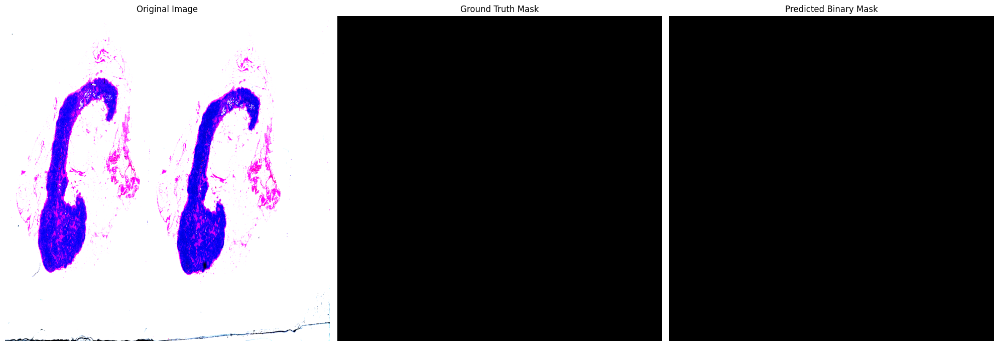

1it [00:01,  1.37s/it]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.6399999].


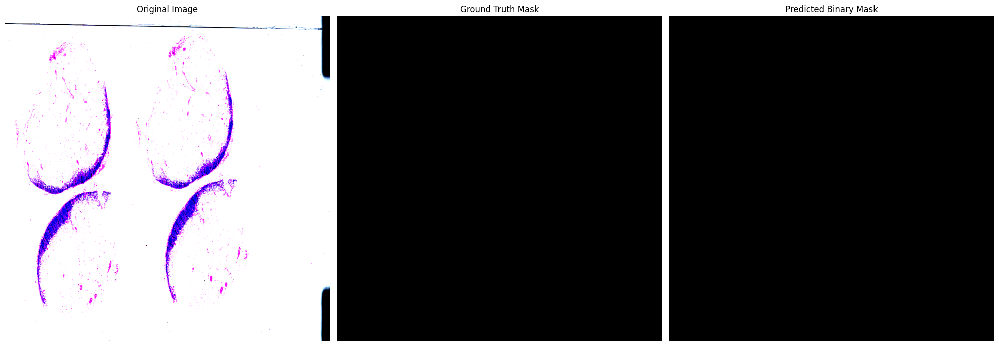

2it [00:02,  1.36s/it]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0151553..2.6399999].


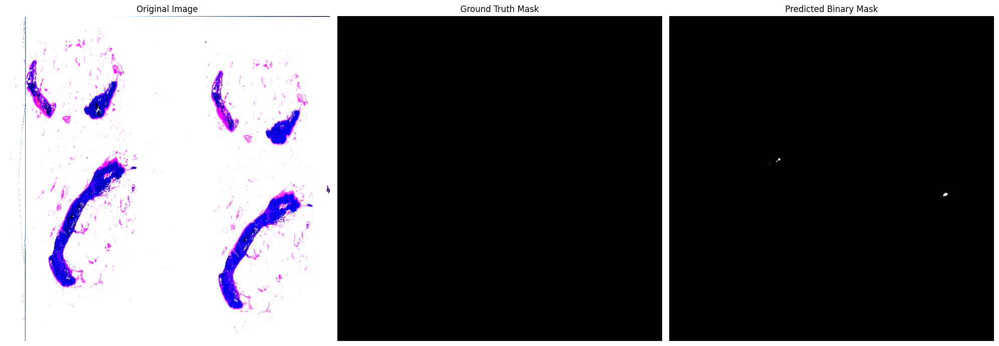

3it [00:04,  1.37s/it]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.9831932..2.6225708].


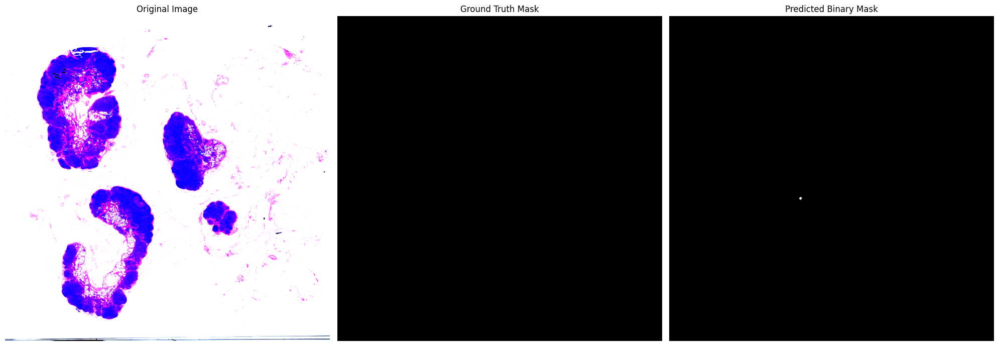

4it [00:05,  1.34s/it]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.1953781..2.448279].


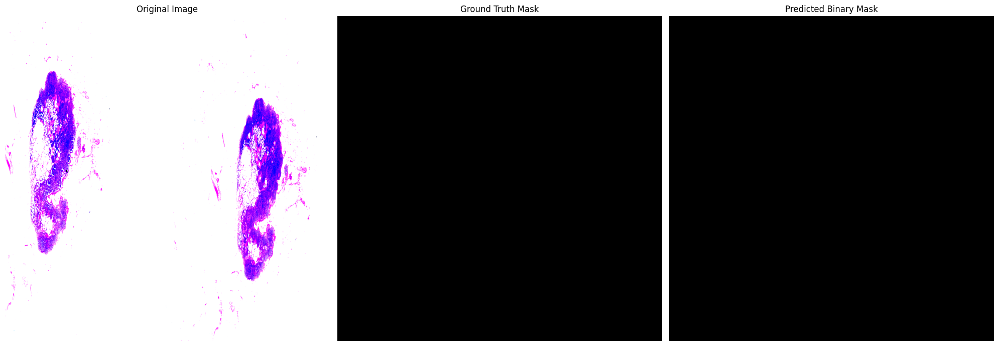

5it [00:06,  1.31s/it]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.6399999].


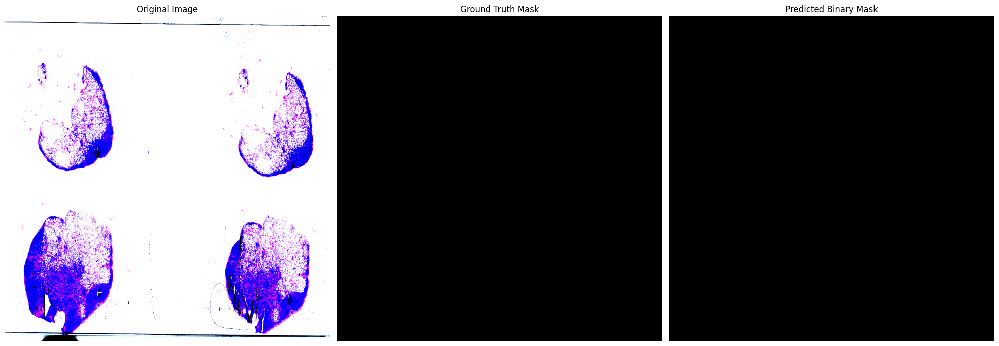

6it [00:07,  1.32s/it]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0357141..2.6225708].


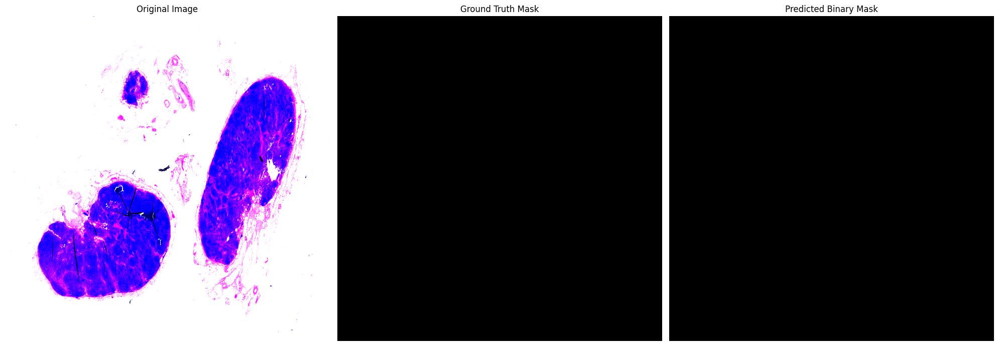

7it [00:09,  1.31s/it]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1007793..2.6399999].


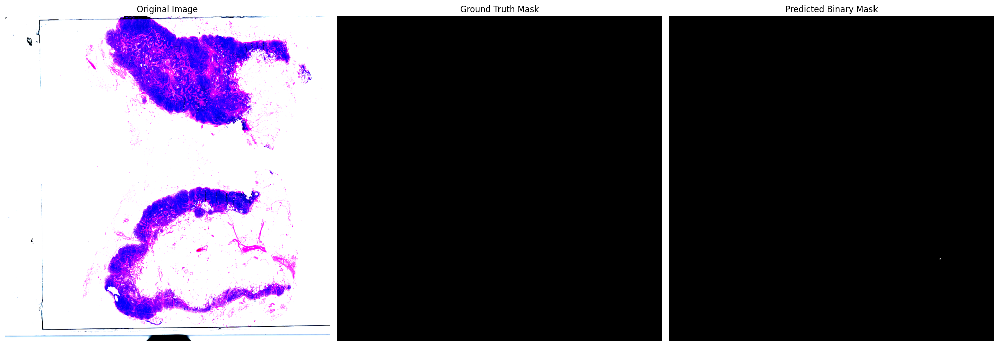

8it [00:10,  1.32s/it]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.9131651..2.6399999].


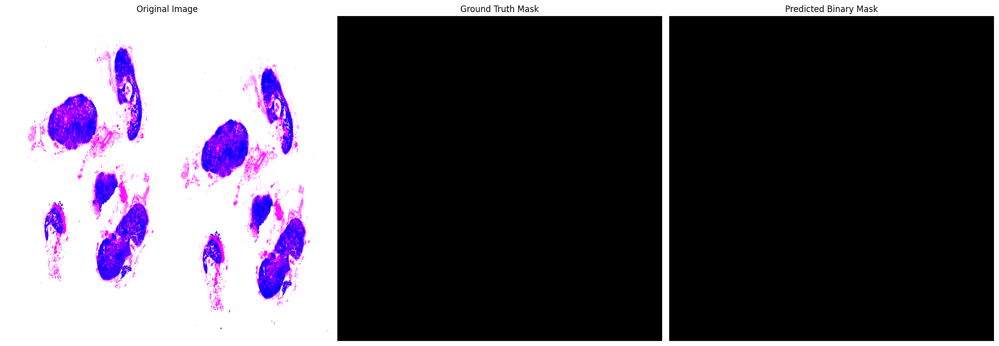

9it [00:11,  1.32s/it]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0357141..2.6399999].


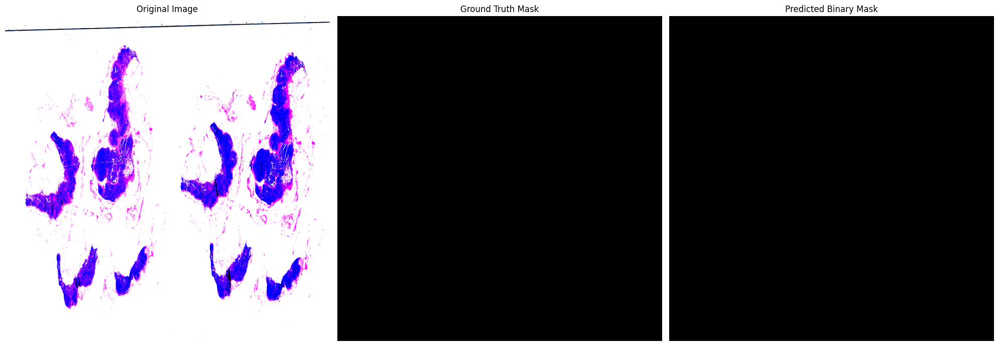

10it [00:13,  1.32s/it]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.9306722..2.5702832].


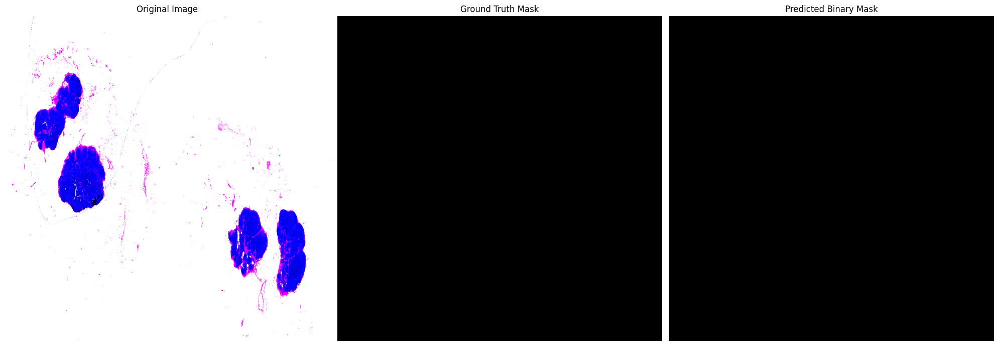

11it [00:14,  1.31s/it]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.6399999].


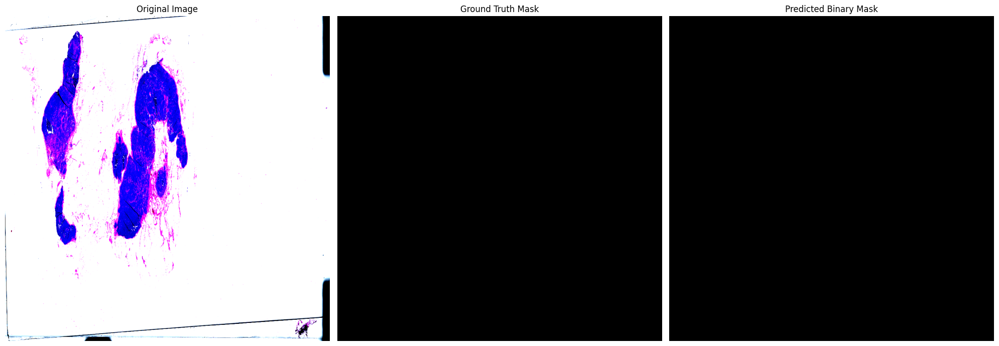

12it [00:15,  1.33s/it]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0357141..2.6399999].


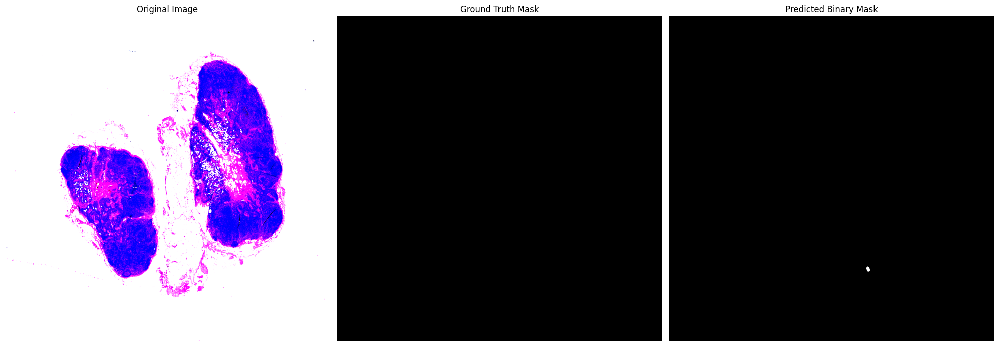

13it [00:17,  1.30s/it]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.9466563..2.6399999].


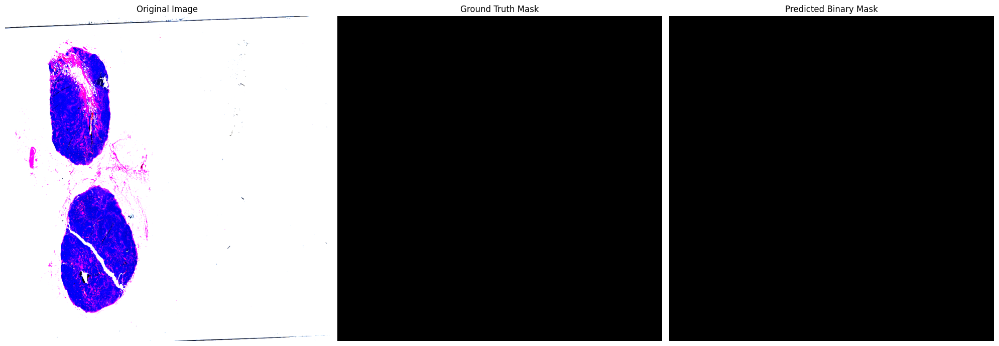

14it [00:18,  1.31s/it]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0357141..2.5877123].


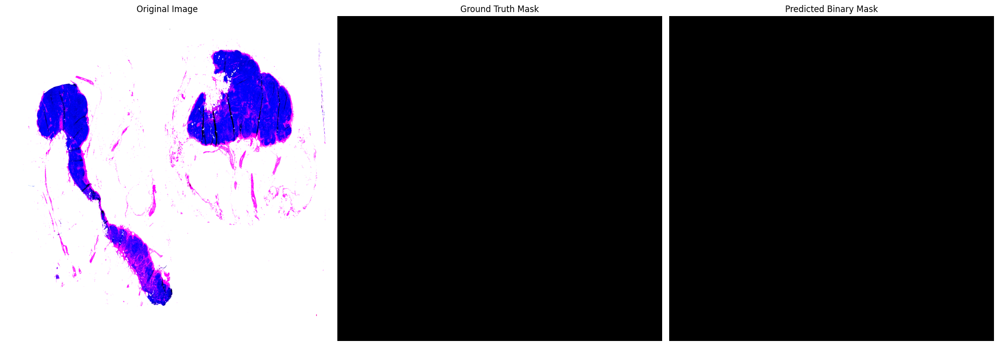

15it [00:19,  1.29s/it]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0007002..2.6399999].


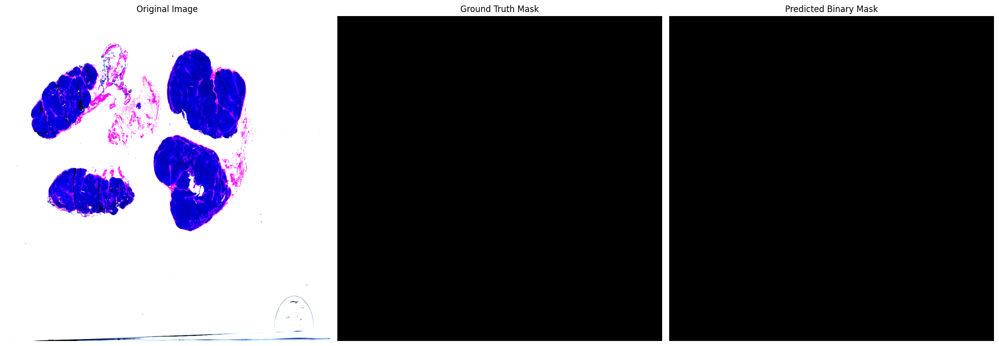

16it [00:21,  1.28s/it]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.018207..2.5877123].


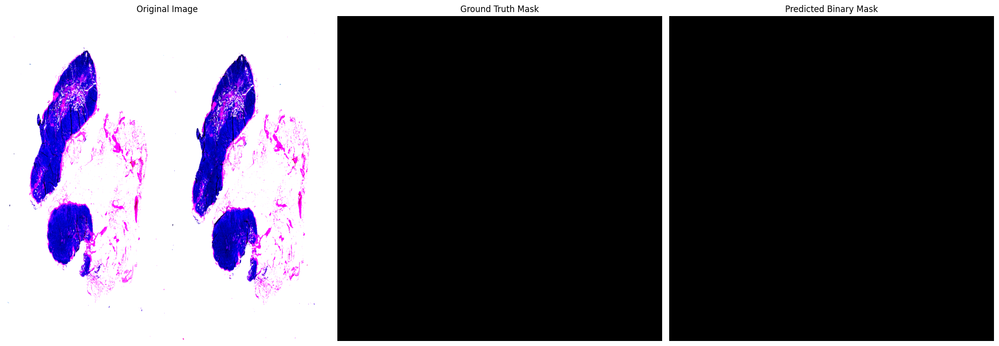

17it [00:22,  1.29s/it]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0665298..2.6399999].


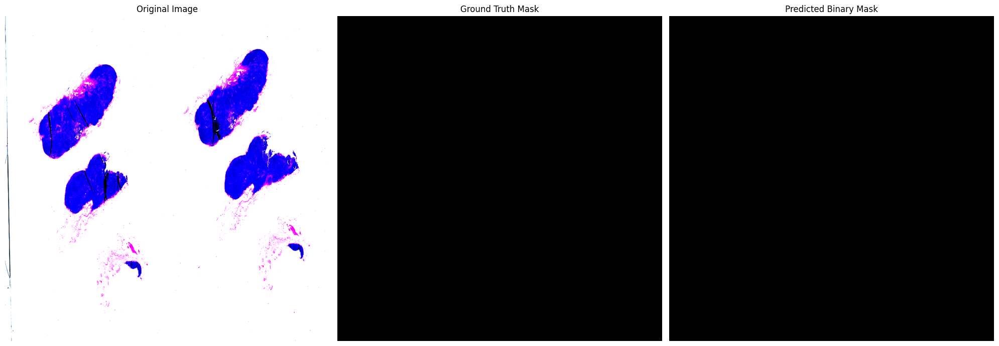

18it [00:23,  1.28s/it]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0494049..2.378562].


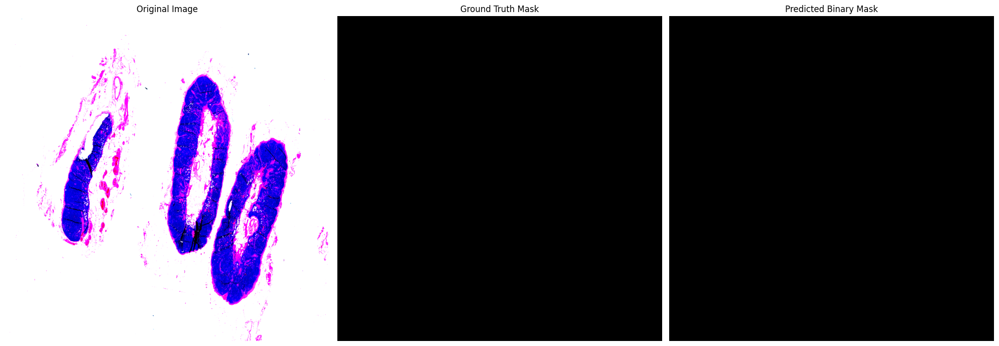

19it [00:24,  1.28s/it]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.018207..2.6399999].


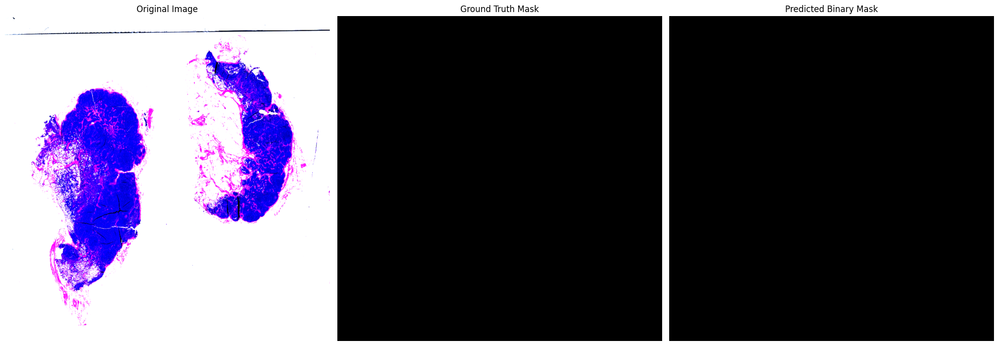

20it [00:26,  1.29s/it]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0357141..2.5354247].


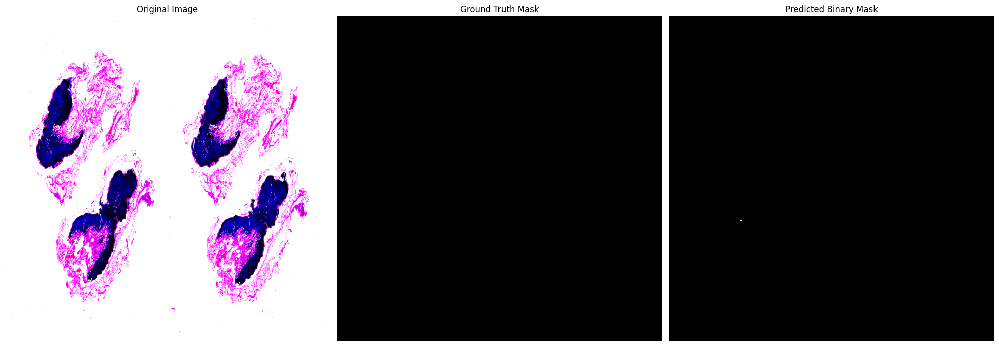

21it [00:27,  1.30s/it]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.6330531..2.3611329].


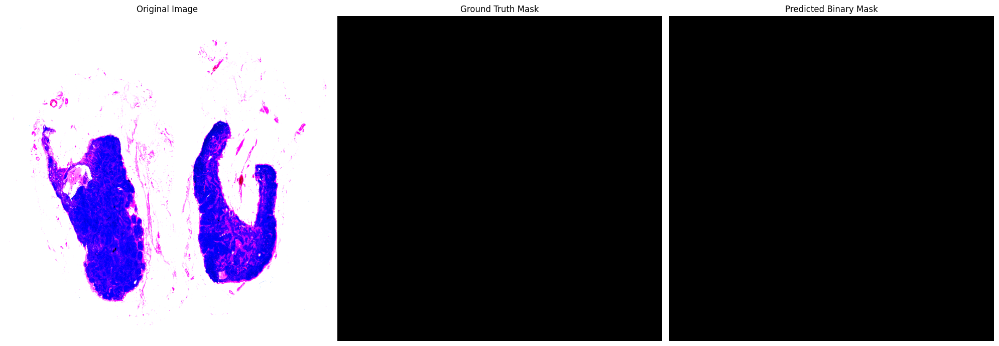

22it [00:28,  1.31s/it]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0494049..2.6399999].


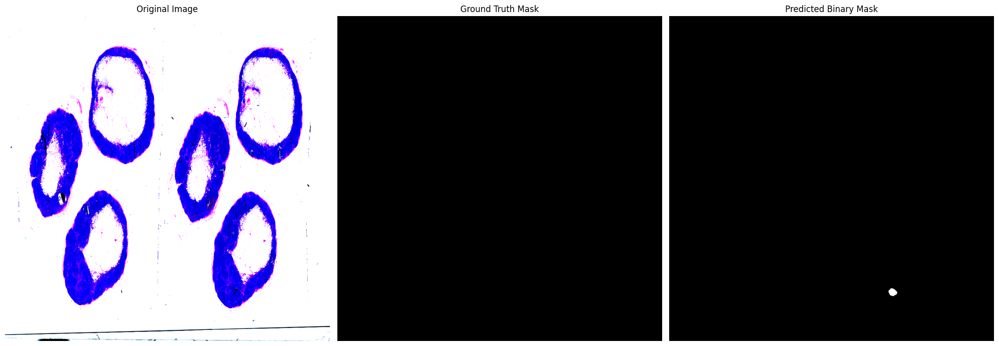

23it [00:30,  1.32s/it]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.8256301..2.448279].


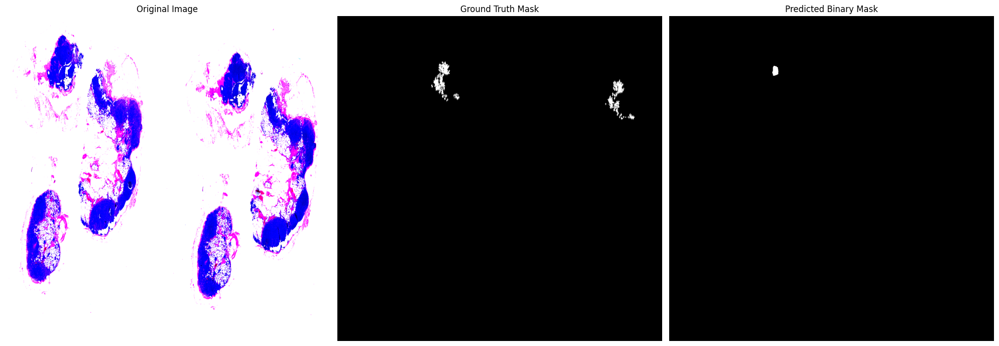

24it [00:31,  1.32s/it]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.9831932..2.6051416].


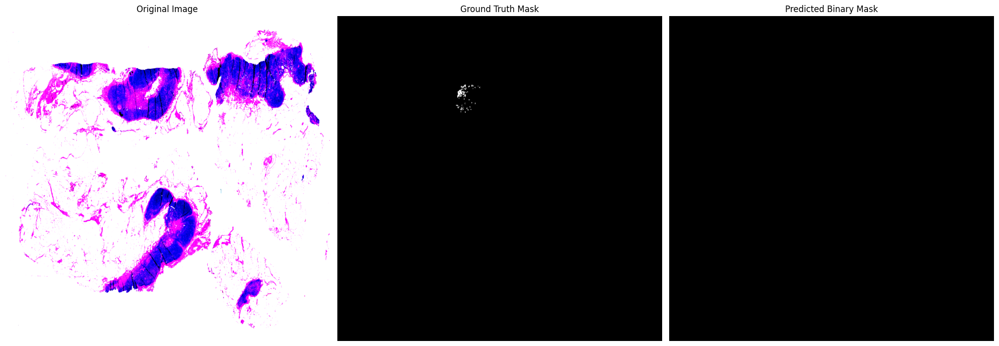

25it [00:32,  1.32s/it]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.9656861..2.6225708].


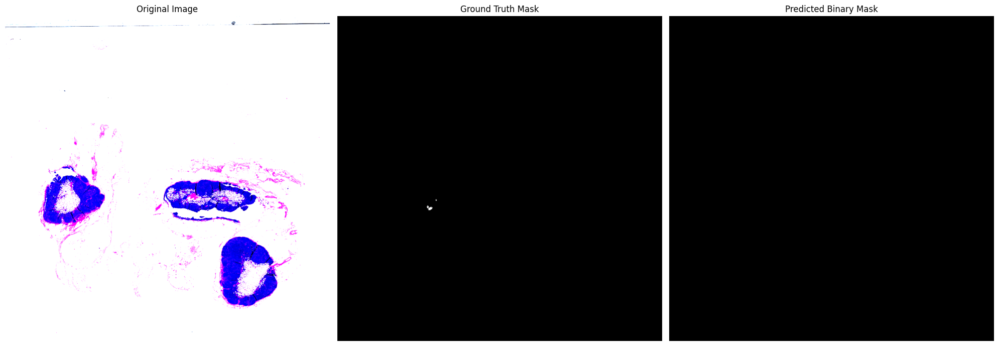

26it [00:34,  1.31s/it]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.5105041..2.6399999].


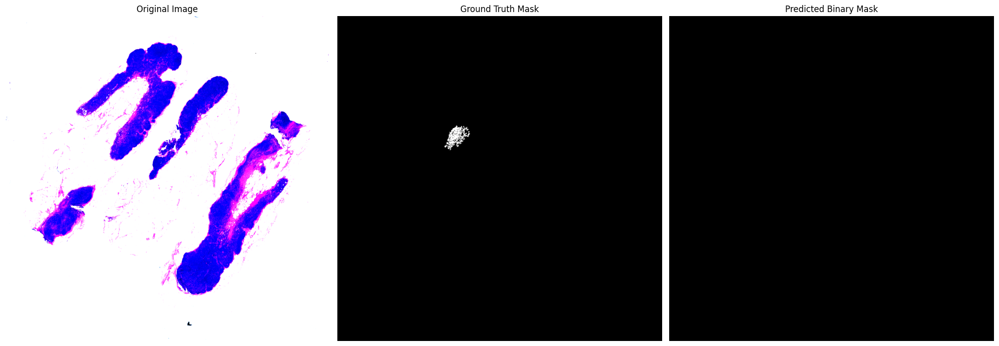

27it [00:35,  1.45s/it]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.9306722..2.6399999].


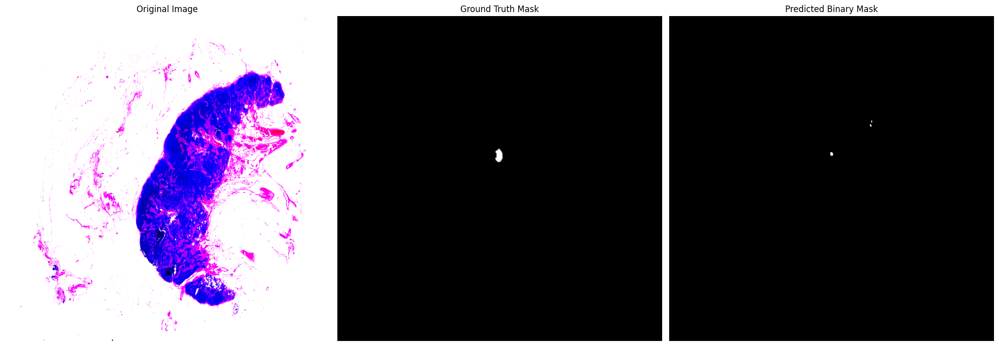

28it [00:37,  1.40s/it]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.8431371..2.378562].


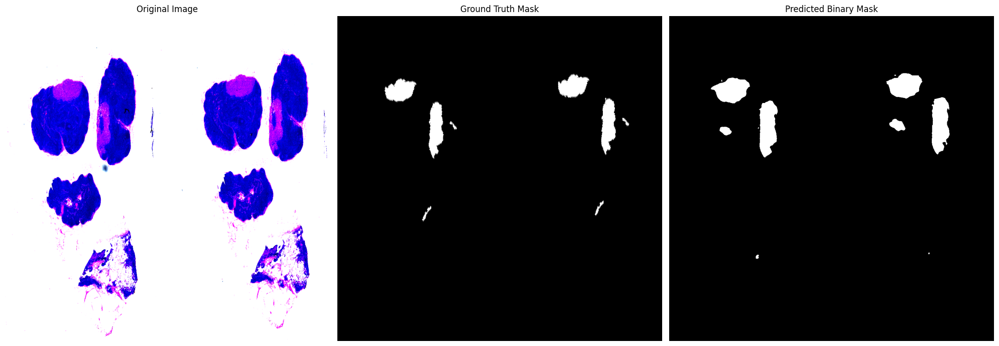

29it [00:38,  1.37s/it]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.018207..2.6399999].


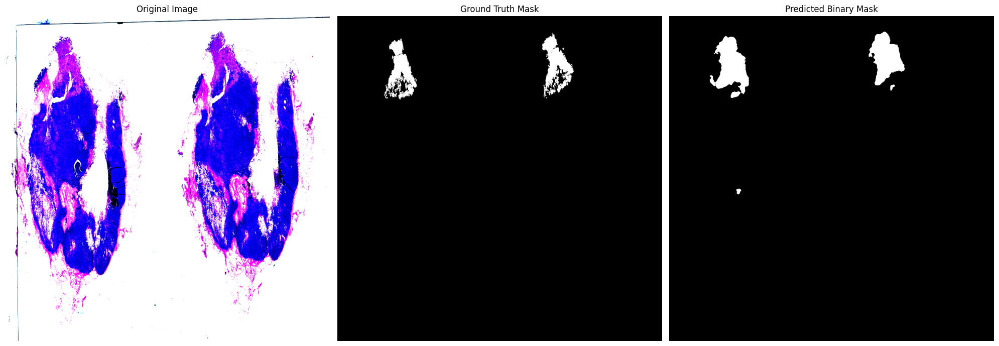

30it [00:39,  1.41s/it]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0357141..2.6399999].


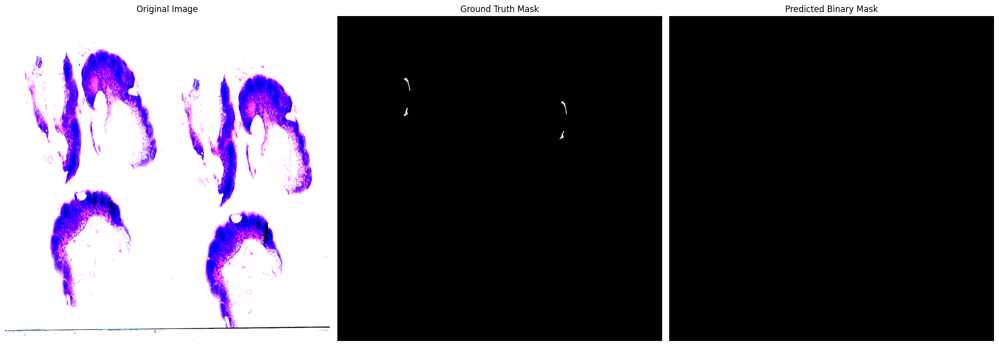

31it [00:41,  1.38s/it]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.9656861..2.6225708].


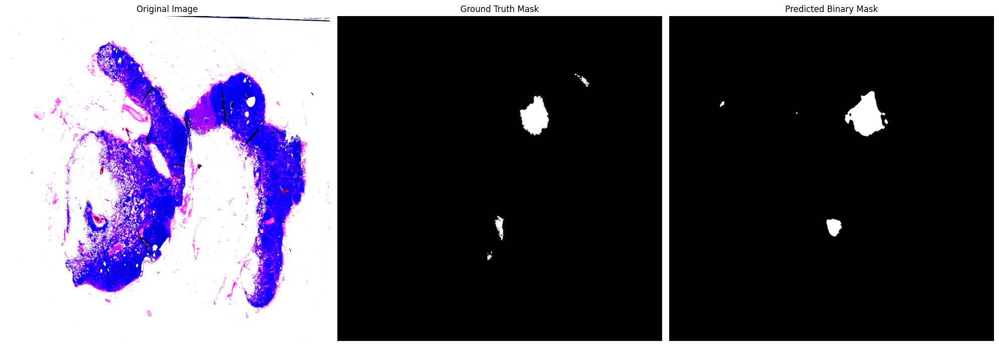

32it [00:42,  1.37s/it]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.9831932..2.5179956].


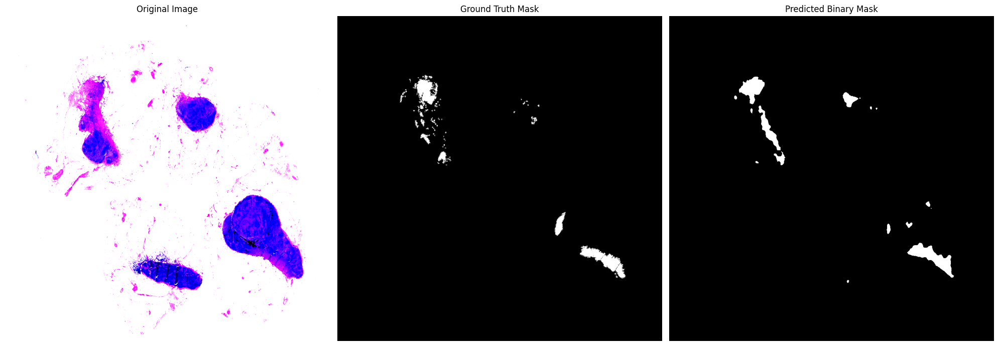

33it [00:43,  1.34s/it]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0665298..2.6399999].


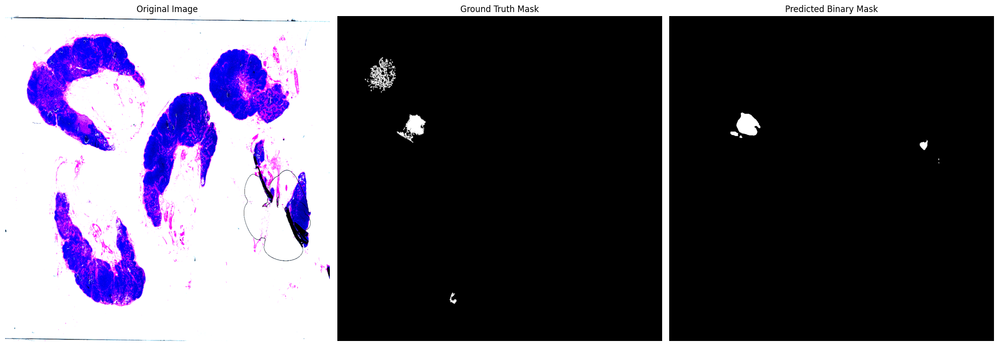

34it [00:45,  1.33s/it]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0357141..2.465708].


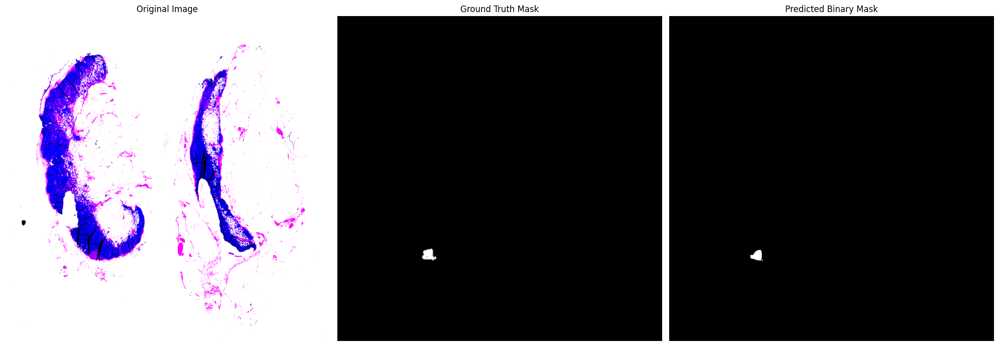

35it [00:46,  1.32s/it]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0494049..2.6225708].


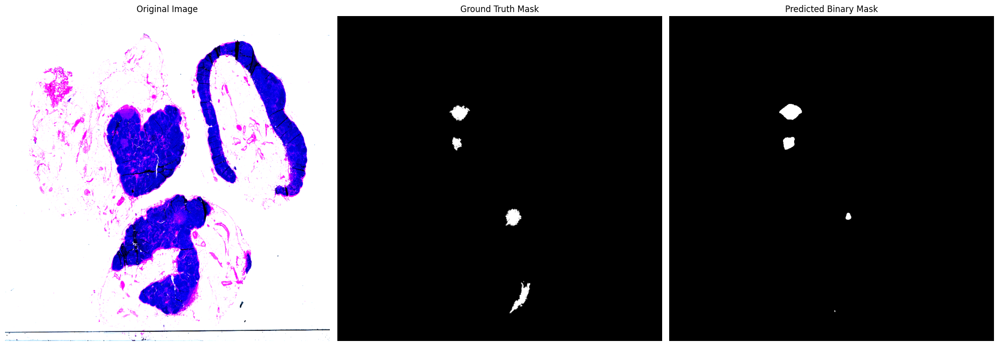

36it [00:47,  1.33s/it]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.5980392..2.5179956].


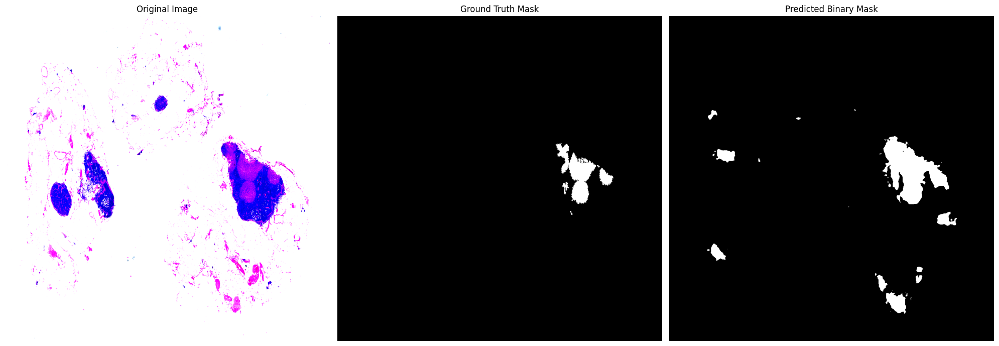

37it [00:49,  1.31s/it]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.6330531..2.5702832].


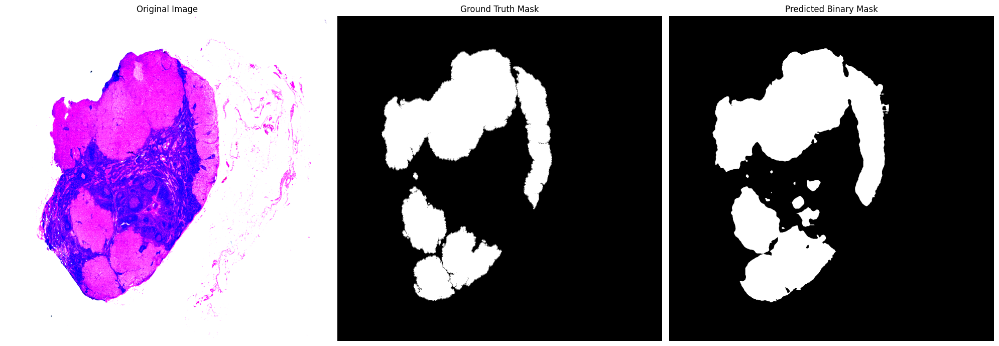

38it [00:50,  1.32s/it]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.7556021..2.6399999].


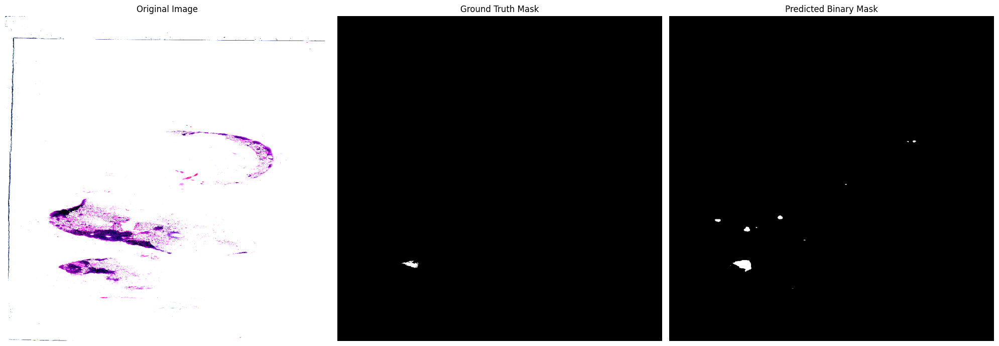

39it [00:51,  1.33s/it]


In [ ]:
import matplotlib.pyplot as plt
import torch
from PIL import Image
import numpy as np
from tqdm import tqdm
import matplotlib.cm as cm
from mpl_toolkits.axes_grid1 import make_axes_locatable
import torch.nn.functional as F

# Dataset
test_dataset = SegmentationDataset(
    #"/content/drive/MyDrive/ML4H_project/Dataset/UNet_training/new/valid",
    "/content/drive/MyDrive/ML4H_project/Dataset/UNet_training/new/test",
    image_size=(1024, 1024),
    augment=False
)
test_loader = DataLoader(test_dataset, batch_size=1)

model.eval()

count = 0
with torch.no_grad():
    for i, (images, masks) in tqdm(enumerate(test_loader)):

        count += 1
        images = images.to(device)

        # Forward pass
        preds = model(images).logits
        preds = F.interpolate(preds, size=(1024, 1024), mode='bilinear', align_corners=False)
        preds = preds.squeeze(1)

        # Convert tensors to NumPy
        image_np = images.squeeze(0).permute(1, 2, 0).cpu().numpy()
        mask_np = masks.squeeze(0).squeeze(0).cpu().numpy()
        pred_np = torch.sigmoid(preds).squeeze(0).cpu().numpy()

        # 💥 Apply Threshold at 0.5 to make binary prediction
        binary_pred_np = (pred_np > 0.05).astype(np.float32)

        # Plot side-by-side
        fig, axs = plt.subplots(1, 3, figsize=(20, 7))

        # 1. Original Image
        axs[0].imshow(image_np)
        axs[0].set_title("Original Image")
        axs[0].axis("off")

        # 2. Ground Truth Mask
        axs[1].imshow(mask_np, cmap='gray')
        axs[1].set_title("Ground Truth Mask")
        axs[1].axis("off")

        # 3. Binary Prediction Mask
        axs[2].imshow(binary_pred_np, cmap='gray')  # <--- Binary mask plotted here
        axs[2].set_title("Predicted Binary Mask")
        axs[2].axis("off")

        plt.tight_layout()
        plt.show()

        # Save the raw prediction (optional)
        pred_uint8 = (pred_np * 255).astype(np.uint8)
        img = Image.fromarray(pred_uint8)
        img.save(f"/content/drive/MyDrive/ML4H_project/Dataset/UNet_training/pred_mask/pred_{count}.png")

## Step 6-2. Mask prediction_heatmap_Transformer

0it [00:00, ?it/s]<ipython-input-16-91dbd880c32b>:38: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('jet', 256)
0it [00:02, ?it/s]


KeyboardInterrupt: 

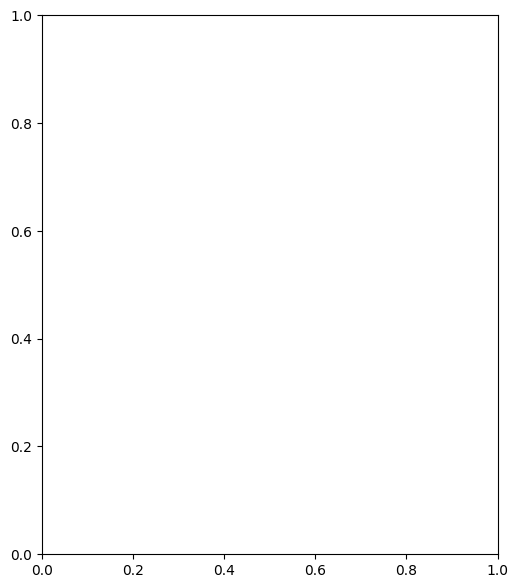

In [ ]:
import matplotlib.pyplot as plt
import torch
from PIL import Image
import numpy as np
from tqdm import tqdm
import matplotlib.cm as cm
from mpl_toolkits.axes_grid1 import make_axes_locatable  # for neat colorbar
import torch.nn.functional as F

# Dataset
test_dataset = SegmentationDataset(
    "/content/drive/MyDrive/ML4H_project/Dataset/UNet_training/new/test",
    image_size=(256, 256),
    augment=False
)
test_loader = DataLoader(test_dataset, batch_size=1)

model.eval()

count = 0
with torch.no_grad():
    for i, (images, masks) in tqdm(enumerate(test_loader)):

        count += 1
        images = images.to(device)

        # Forward pass through Segformer
        preds = model(images).logits            # [B, 1, 64, 64]
        preds = F.interpolate(preds, size=(256, 256), mode='bilinear', align_corners=False)  # Upsample
        preds = preds.squeeze(1)                 # [B, 256, 256]

        # Convert tensors to NumPy
        image_np = images.squeeze(0).permute(1, 2, 0).cpu().numpy()  # [H, W, 3]
        mask_np = masks.squeeze(0).squeeze(0).cpu().numpy()          # [H, W]
        pred_np = torch.sigmoid(preds).squeeze(0).cpu().numpy()      # Apply sigmoid -> [H, W]

        # ---- Make RGBA heatmap ----
        cmap = cm.get_cmap('jet', 256)
        heatmap_rgba = cmap(pred_np)  # shape (H, W, 4)

        # Adjust the alpha channel:
        heatmap_rgba[..., -1] = pred_np  # alpha proportional to prediction (0~1)

        # Plot side-by-side
        fig, axs = plt.subplots(1, 3, figsize=(20, 7))

        # 1. Original Image
        axs[0].imshow(image_np)
        axs[0].set_title("Original Image")
        axs[0].axis("off")

        # 2. Ground Truth Mask
        axs[1].imshow(mask_np, cmap='gray')
        axs[1].set_title("Ground Truth Mask")
        axs[1].axis("off")

        # 3. Overlay: Original + Transparent Heatmap
        axs[2].imshow(image_np)
        im = axs[2].imshow(heatmap_rgba)
        axs[2].set_title("Overlayed Transparent Heatmap")
        axs[2].axis("off")

        # Colorbar without resizing the subplot
        divider = make_axes_locatable(axs[2])
        cax = divider.append_axes("right", size="5%", pad=0.05)
        norm = plt.Normalize(vmin=0, vmax=1)
        sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
        sm.set_array([])
        fig.colorbar(sm, cax=cax)

        plt.tight_layout()
        plt.show()

        # Save the raw prediction (optional)
        pred_uint8 = (pred_np * 255).astype(np.uint8)
        img = Image.fromarray(pred_uint8)
        img.save(f"/content/drive/MyDrive/ML4H_project/Dataset/UNet_training/pred_mask/pred_{count}.png")

## Step 7. Result evaluation_binary mask_Transformer

In [ ]:
# Initialize evaluation accumulators
total_dice = 0.0
total_iou = 0.0
total_precision = 0.0
total_recall = 0.0
total_f1 = 0.0
n_samples = 0

# Define metrics again
def dice_score(preds, targets):
    intersection = (preds * targets).sum()
    union = preds.sum() + targets.sum()
    return (2. * intersection + 1e-6) / (union + 1e-6)

def iou_score(preds, targets):
    intersection = (preds * targets).sum()
    union = ((preds + targets) >= 1).sum()
    return (intersection + 1e-6) / (union + 1e-6)

def precision_recall(preds, targets):
    tp = (preds * targets).sum()
    fp = (preds * (1 - targets)).sum()
    fn = ((1 - preds) * targets).sum()
    precision = (tp + 1e-6) / (tp + fp + 1e-6)
    recall = (tp + 1e-6) / (tp + fn + 1e-6)
    return precision, recall

def f1_score(precision, recall):
    return 2 * (precision * recall) / (precision + recall + 1e-6)

# Evaluate predictions
with torch.no_grad():
    for images, masks in tqdm(test_loader):
        images = images.to(device)
        masks = masks.to(device).squeeze(1)  # shape: [B, H, W]

        preds = model(images).logits
        preds = F.interpolate(preds, size=(1024, 1024), mode='bilinear', align_corners=False)
        preds = torch.sigmoid(preds).squeeze(1)

        # Apply threshold
        preds_bin = (preds > 0.02).float()

        for i in range(images.size(0)):
            pred_i = preds_bin[i].cpu().numpy()
            mask_i = masks[i].cpu().numpy()

            # Flatten
            pred_i = pred_i.astype(np.float32)
            mask_i = mask_i.astype(np.float32)

            total_dice += dice_score(pred_i, mask_i)
            total_iou += iou_score(pred_i, mask_i)
            prec, rec = precision_recall(pred_i, mask_i)
            total_precision += prec
            total_recall += rec
            total_f1 += f1_score(prec, rec)

            n_samples += 1

# Report metrics
avg_dice = total_dice / n_samples
avg_iou = total_iou / n_samples
avg_precision = total_precision / n_samples
avg_recall = total_recall / n_samples
avg_f1 = total_f1 / n_samples

print("\n📊 Test Evaluation Results:")
print(f"  Dice Score    : {avg_dice:.4f}")
print(f"  IoU           : {avg_iou:.4f}")
print(f"  Precision     : {avg_precision:.4f}")
print(f"  Recall        : {avg_recall:.4f}")
print(f"  F1 Score      : {avg_f1:.4f}")

100%|██████████| 189/189 [02:06<00:00,  1.50it/s]


📊 Test Evaluation Results:
  Dice Score    : 0.3434
  IoU           : 0.3099
  Precision     : 0.4251
  Recall        : 0.7835
  F1 Score      : 0.3434


189it [02:04,  1.52it/s]


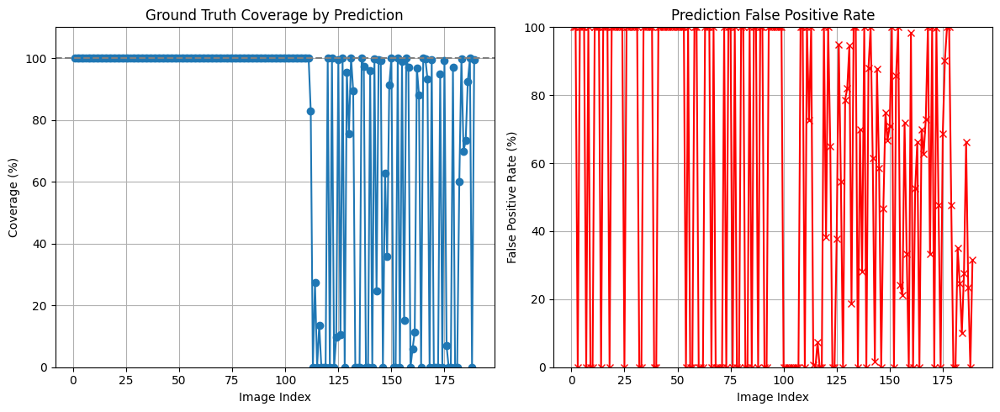

In [ ]:
# Initialize accumulators
coverages = []
false_positive_rates = []

with torch.no_grad():
    for i, (images, masks) in tqdm(enumerate(test_loader)):
        count += 1
        images = images.to(device)

        # Forward pass
        preds = model(images).logits
        preds = F.interpolate(preds, size=(1024, 1024), mode='bilinear', align_corners=False)
        preds = preds.squeeze(1)

        image_np = images.squeeze(0).permute(1, 2, 0).cpu().numpy()
        mask_np = masks.squeeze(0).squeeze(0).cpu().numpy()
        pred_np = torch.sigmoid(preds).squeeze(0).cpu().numpy()

        binary_pred_np = (pred_np > 0.02).astype(np.float32)

        # Evaluation
        gt = (mask_np > 0.5).astype(np.float32)
        pred = (binary_pred_np > 0.5).astype(np.float32)

        intersection = (gt * pred).sum()
        gt_area = gt.sum()
        pred_area = pred.sum()
        false_positive_area = ((pred == 1) & (gt == 0)).sum()

        # Handle edge case: empty ground truth
        if gt_area == 0:
            coverage = 1.0  # 100% by default
        else:
            coverage = intersection / (gt_area + 1e-6)

        false_positive_rate = false_positive_area / (pred_area + 1e-6)

        coverages.append(coverage)
        false_positive_rates.append(false_positive_rate)

        # [Optional: save image/pred/mask here]

# --- Plotting the Metrics ---
import matplotlib.pyplot as plt

x = list(range(1, len(coverages) + 1))

plt.figure(figsize=(12, 5))

# Coverage
plt.subplot(1, 2, 1)
plt.plot(x, [c * 100 for c in coverages], marker='o', label="GT Coverage (%)")
plt.axhline(100, color='gray', linestyle='--')
plt.xlabel("Image Index")
plt.ylabel("Coverage (%)")
plt.title("Ground Truth Coverage by Prediction")
plt.grid(True)
plt.ylim(0, 110)

# False Positive Rate
plt.subplot(1, 2, 2)
plt.plot(x, [fpr * 100 for fpr in false_positive_rates], marker='x', color='red', label="False Positive Rate (%)")
plt.xlabel("Image Index")
plt.ylabel("False Positive Rate (%)")
plt.title("Prediction False Positive Rate")
plt.grid(True)
plt.ylim(0, 100)

plt.tight_layout()
plt.show()

## Step 8. (Optional) Hyperparameter tuning

In [ ]:
!pip install optuna

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 386.6/386.6 kB 8.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 231.9/231.9 kB 25.6 MB/s eta 0:00:00


In [ ]:
import optuna
import torch
import torch.nn as nn
import torch.optim as optim
import segmentation_models_pytorch as smp
from torch.utils.data import DataLoader
from sklearn.metrics import jaccard_score
import numpy as np

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

def objective(trial):
    # 🔧 Tune hyperparameters
    encoder = trial.suggest_categorical("encoder", ["resnet34", "resnet50", "densenet169", "efficientnet-b0", "mit_b0"])
    lr = trial.suggest_float("lr", 1e-5, 1e-3, log=True)
    batch_size = trial.suggest_categorical("batch_size", [1, 4, 8, 16])

    # 🔧 Model
    model = smp.Unet(
        encoder_name=encoder,
        encoder_weights="imagenet",
        in_channels=3,
        classes=1
    ).to(device)

    # 🔧 Data
    #train_dataset = SegmentationDataset("/content/drive/MyDrive/ML4H_project/Dataset/UNet_training/train", augment=True)
    #val_dataset = SegmentationDataset("/content/drive/MyDrive/ML4H_project/Dataset/UNet_training/valid")
    train_dataset = SegmentationDataset("/content/drive/MyDrive/ML4H_project/Dataset/UNet_training/new/resize/train", augment=True)
    val_dataset = SegmentationDataset("/content/drive/MyDrive/ML4H_project/Dataset/UNet_training/new/valid")

    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=1)

    optimizer = optim.Adam(model.parameters(), lr=lr)
    criterion = nn.BCEWithLogitsLoss()

    # 🔁 Train for a few epochs
    num_epochs = 5
    for epoch in range(num_epochs):
        model.train()
        for images, masks in train_loader:
            images, masks = images.to(device), masks.to(device)
            outputs = model(images)
            loss = criterion(outputs, masks)
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

    # 🔍 Evaluate using IoU
    model.eval()
    iou_scores = []
    with torch.no_grad():
        for images, masks in val_loader:
            images = images.to(device)
            outputs = model(images)
            preds = (torch.sigmoid(outputs) > 0.5).float().cpu().numpy().flatten()
            masks = masks.cpu().numpy().flatten()
            iou = jaccard_score(masks, preds, zero_division=1)
            iou_scores.append(iou)

    return np.mean(iou_scores)  # Optuna tries to maximize this

In [ ]:
study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=20)

print("Best hyperparameters:")
print(study.best_params)

[I 2025-04-28 14:32:11,670] A new study created in memory with name: no-name-d027647d-3849-4b0d-937c-98b04ab21812


config.json:   0%|          | 0.00/156 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/87.3M [00:00<?, ?B/s]

[W 2025-04-28 14:32:13,409] Trial 0 failed with parameters: {'encoder': 'resnet34', 'lr': 0.0001894875006397206, 'batch_size': 4} because of the following error: NameError("name 'SegmentationDataset' is not defined").
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/optuna/study/_optimize.py", line 197, in _run_trial
    value_or_values = func(trial)
                      ^^^^^^^^^^^
  File "<ipython-input-5-ead0ff1fafc8>", line 29, in objective
    train_dataset = SegmentationDataset("/content/drive/MyDrive/ML4H_project/Dataset/UNet_training/new/resize/train", augment=True)
                    ^^^^^^^^^^^^^^^^^^^
NameError: name 'SegmentationDataset' is not defined
[W 2025-04-28 14:32:13,410] Trial 0 failed with value None.


NameError: name 'SegmentationDataset' is not defined